# 3D Multi-class Segmentation with UNETR  (Muscle, Fat (subcut and internal), psoas,Cavity,BGD)

## Setup environment

In [1]:
!pip install -q "monai-weekly[nibabel, tqdm, einops]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

In [2]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    EnsureChannelFirstd,
    AddChanneld,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    ToTensord,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNETR

from monai.data import (
    DataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


import torch

print_config()

MONAI version: 0.10.dev2231
Numpy version: 1.23.1
Pytorch version: 1.12.0+cu102
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 8236821c099e5997f7ad0410c5374e4472f4ed14
MONAI __file__: /home/adminbthomas/miniconda3/envs/PT02/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.9
Nibabel version: 4.0.1
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: 2.9.1
gdown version: 4.5.1
TorchVision version: 0.13.0+cu102
tqdm version: 4.64.0
lmdb version: 1.3.0
psutil version: 5.9.1
pandas version: 1.4.3
einops version: 0.4.1
transformers version: 4.20.1
mlflow version: 1.27.0
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory
  


In [3]:
# directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = "/home/adminbthomas/Downloads/ensemble/unetr"# root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/home/adminbthomas/Downloads/ensemble/unetr


## Setup transforms for training and validation

In [4]:
import datetime
import time

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=0,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=False,   # change-intermedouts 
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 16),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
        ToTensord(keys=["image", "label"]),
#         SaveImaged(keys="image", meta_keys="image_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
#         SaveImaged(keys="label", meta_keys="label_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250, b_min=0.0, b_max=1.0, clip=False
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        ToTensord(keys=["image", "label"]),
    ]
)

### DATA

In [5]:
data_dir = os.path.join(root_dir,"data/")

In [6]:
split_JSON = "dataset_MR09fold4.json"
datasets = data_dir + split_JSON
datalist = load_decathlon_datalist(datasets, True, "training")
val_files = load_decathlon_datalist(datasets, True, "validation")
train_ds = CacheDataset(
    data=datalist,
    transform=train_transforms,
    cache_num=24,
    cache_rate=1.0,
    num_workers=8,
)
train_loader = DataLoader(
    train_ds, batch_size=1, shuffle=True, num_workers=8, pin_memory=True
)
val_ds = CacheDataset(
    data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset:   0%|                                                                                                                                                       | 0/12 [00:00<?, ?it/s]Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]
Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  8.02it/s]


## Check data shape and visualize

image shape: torch.Size([1, 250, 176, 25]), label shape: torch.Size([1, 250, 176, 25])


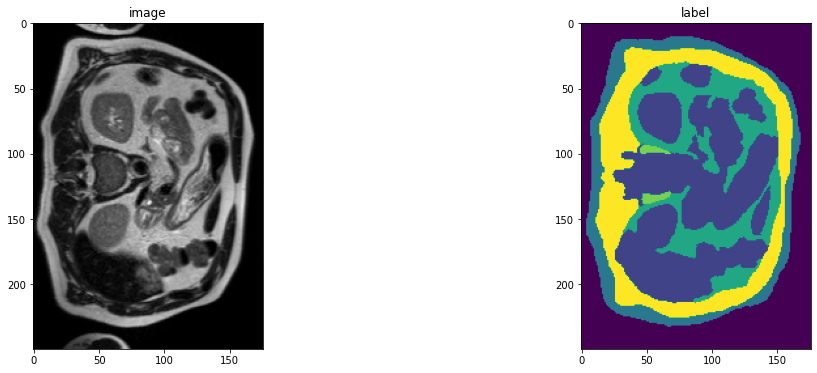

In [7]:
slice_map = {
    "A024_v1_T2W.nii.gz": 10,
    "A024_v1_T2W.nii.gz": 8,
    "A024_v1_T2W.nii.gz": 6
}
case_num = 1
img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
img = val_ds[case_num]["image"]
label = val_ds[case_num]["label"]
img_shape = img.shape
label_shape = label.shape
print(f"image shape: {img_shape}, label shape: {label_shape}")
plt.figure("image", (18, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(img[0, :, :, slice_map[img_name]].detach().cpu(), cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[0, :, :, slice_map[img_name]].detach().cpu())
plt.show()

### Create Model, Loss, Optimizer


In [5]:
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda:0")

model = UNETR(
    in_channels=1,
    out_channels=6,
    img_size=(96, 96, 16),
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

### Execute a typical PyTorch training process

In [9]:
def validation(epoch_iterator_val):
    model.eval()
    dice_vals = list()
    with torch.no_grad():
        for step, batch in enumerate(epoch_iterator_val):
            val_inputs, val_labels = (batch["image"].to(device), batch["label"].to(device))
            val_outputs = sliding_window_inference(val_inputs, (96, 96, 16), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [
                post_label(val_label_tensor) for val_label_tensor in val_labels_list
            ]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [
                post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list
            ]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            dice = dice_metric.aggregate().item()
            dice_vals.append(dice)
            epoch_iterator_val.set_description(
                "Validate (%d / %d Steps) (dice=%2.5f)" % (global_step, 10.0, dice)
            )
        dice_metric.reset()
    mean_dice_val = np.mean(dice_vals)
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best):
    model.train()
    epoch_loss = 0
    step = 0
    epoch_iterator = tqdm(
        train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True
    )
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].to(device), batch["label"].to(device))
#         print(x.shape)
#         print(y.shape)
#         plt.figure("image", (18, 6))
#         plt.subplot(1, 2, 1)
#         plt.title("image")
#         plt.imshow(x[3,0,:,:,4].detach().cpu(), cmap="gray")
#         plt.subplot(1, 2, 2)
#         plt.title("label")
#         plt.imshow(y[3,0,:,:,4].detach().cpu())
#         plt.show()
        logit_map = model(x)
        loss = loss_function(logit_map, y)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()
        optimizer.zero_grad()
        epoch_iterator.set_description(
            "Training (%d / %d Steps) (loss=%2.5f)" % (global_step, max_iterations, loss)
        )
        if (
            global_step % eval_num == 0 and global_step != 0
        ) or global_step == max_iterations:
            epoch_iterator_val = tqdm(
                val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True
            )
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            metric_values.append(dice_val)
            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                torch.save(
                    model.state_dict(), os.path.join(root_dir, "TestMR09_unetrensemble_fold4.pth")
                )
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
            else:
                print(
                    "Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
        global_step += 1
        
    return global_step, dice_val_best, global_step_best


max_iterations = 70000
eval_num = 250
post_label = AsDiscrete(to_onehot=6)
post_pred = AsDiscrete(argmax=True, to_onehot=6)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []
while global_step < max_iterations:
    global_step, dice_val_best, global_step_best = train(
        global_step, train_loader, dice_val_best, global_step_best
    )
#     print('I am waiting....')
#     time.sleep(1)
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold4.pth")))

Training (251 / 70000 Steps) (loss=1.67218): 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.16it/s]

Model Was Saved ! Current Best Avg. Dice: 0.589541474978129 Current Avg. Dice: 0.589541474978129


Training (501 / 70000 Steps) (loss=1.60450):  83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 10/12 [00:03<00:00,  2.11it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6357665061950684 Current Avg. Dice: 0.6357665061950684


Training (751 / 70000 Steps) (loss=1.28884):  67%|████████████████████████████████████████████████████████████████████████████▋                                      | 8/12 [00:03<00:01,  2.03it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6478797793388367 Current Avg. Dice: 0.6478797793388367


Training (1001 / 70000 Steps) (loss=1.11644):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.77it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6714670062065125 Current Avg. Dice: 0.6714670062065125


Training (1251 / 70000 Steps) (loss=0.97981):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.57it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6894199450810751 Current Avg. Dice: 0.6894199450810751


Training (1501 / 70000 Steps) (loss=1.30759):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.05s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6971211036046346 Current Avg. Dice: 0.6971211036046346


Training (1751 / 70000 Steps) (loss=0.92799): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.07it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6984317104021708 Current Avg. Dice: 0.6984317104021708


Training (2001 / 70000 Steps) (loss=0.86017):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.03it/s]

Model Was Saved ! Current Best Avg. Dice: 0.707908034324646 Current Avg. Dice: 0.707908034324646


Training (2251 / 70000 Steps) (loss=0.81282):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:02<00:01,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.707908034324646 Current Avg. Dice: 0.7077798048655192


Training (2501 / 70000 Steps) (loss=1.16824):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.80it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7117960254351298 Current Avg. Dice: 0.7117960254351298


Training (2751 / 70000 Steps) (loss=1.41346):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.56it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7154617508252462 Current Avg. Dice: 0.7154617508252462


Training (3001 / 70000 Steps) (loss=1.23307):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.00s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7254433830579122 Current Avg. Dice: 0.7254433830579122


Training (3251 / 70000 Steps) (loss=1.01428): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7254433830579122 Current Avg. Dice: 0.7199039657910665


Training (3501 / 70000 Steps) (loss=0.86722):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7254433830579122 Current Avg. Dice: 0.7075399160385132


Training (3751 / 70000 Steps) (loss=0.60855):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7254433830579122 Current Avg. Dice: 0.7229676842689514


Training (4001 / 70000 Steps) (loss=0.68349):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7254433830579122 Current Avg. Dice: 0.7218830386797587


Training (4251 / 70000 Steps) (loss=0.51429):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7254433830579122 Current Avg. Dice: 0.7179439663887024


Training (4501 / 70000 Steps) (loss=1.11411):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.09s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7292461395263672 Current Avg. Dice: 0.7292461395263672


Training (4751 / 70000 Steps) (loss=0.67429): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7292461395263672 Current Avg. Dice: 0.7172512213389078


Training (5001 / 70000 Steps) (loss=0.88844):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.05it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7314354777336121 Current Avg. Dice: 0.7314354777336121


Training (5251 / 70000 Steps) (loss=0.56676):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.00it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7348106702168783 Current Avg. Dice: 0.7348106702168783


Training (5501 / 70000 Steps) (loss=0.75819):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.76it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7407684326171875 Current Avg. Dice: 0.7407684326171875


Training (5751 / 70000 Steps) (loss=0.73968):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7407684326171875 Current Avg. Dice: 0.7302922209103903


Training (6001 / 70000 Steps) (loss=0.65998):  17%|███████████████████                                                                                               | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7407684326171875 Current Avg. Dice: 0.7362850904464722


Training (6251 / 70000 Steps) (loss=0.73237): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7407684326171875 Current Avg. Dice: 0.7327432831128439


Training (6501 / 70000 Steps) (loss=0.74451):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.05it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7432097395261129 Current Avg. Dice: 0.7432097395261129


Training (6751 / 70000 Steps) (loss=0.49936):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:02<00:01,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7432097395261129 Current Avg. Dice: 0.7354757388432821


Training (7001 / 70000 Steps) (loss=0.45605):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.78it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7504228154818217 Current Avg. Dice: 0.7504228154818217


Training (7251 / 70000 Steps) (loss=0.54729):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.52it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7760461767514547 Current Avg. Dice: 0.7760461767514547


Training (7501 / 70000 Steps) (loss=0.83530):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.00s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8173386454582214 Current Avg. Dice: 0.8173386454582214


Training (7751 / 70000 Steps) (loss=0.84523): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.05it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8528784116109213 Current Avg. Dice: 0.8528784116109213


Training (8001 / 70000 Steps) (loss=0.63296):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.72it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8528784116109213 Current Avg. Dice: 0.8492724498112997


Training (8251 / 70000 Steps) (loss=0.68377):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8528784116109213 Current Avg. Dice: 0.8513087828954061


Training (8501 / 70000 Steps) (loss=0.46810):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.82it/s]

Model Was Saved ! Current Best Avg. Dice: 0.85300745566686 Current Avg. Dice: 0.85300745566686


Training (8751 / 70000 Steps) (loss=0.70063):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.49it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8550223112106323 Current Avg. Dice: 0.8550223112106323


Training (9001 / 70000 Steps) (loss=1.00051):  17%|███████████████████                                                                                               | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8550223112106323 Current Avg. Dice: 0.8334317803382874


Training (9251 / 70000 Steps) (loss=0.64334): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8550223112106323 Current Avg. Dice: 0.8485960563023885


Training (9501 / 70000 Steps) (loss=0.47924):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:01,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8619996110598246 Current Avg. Dice: 0.8619996110598246


Training (9751 / 70000 Steps) (loss=0.49603):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.93it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8643409411112467 Current Avg. Dice: 0.8643409411112467


Training (10001 / 70000 Steps) (loss=0.43557):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.78it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8645781874656677 Current Avg. Dice: 0.8645781874656677


Training (10251 / 70000 Steps) (loss=0.36704):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.97it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8645781874656677 Current Avg. Dice: 0.85958864291509


Training (10501 / 70000 Steps) (loss=0.45027):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:11,  1.13s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8711061676343282


Training (10751 / 70000 Steps) (loss=0.44541): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8451239267985026


Training (11001 / 70000 Steps) (loss=0.52298):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8547972838083903


Training (11251 / 70000 Steps) (loss=0.54242):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8707390228907267


Training (11501 / 70000 Steps) (loss=0.51318):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8697867592175802


Training (11751 / 70000 Steps) (loss=0.48103):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8607388933499655


Training (12001 / 70000 Steps) (loss=0.48751):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8708373705546061


Training (12251 / 70000 Steps) (loss=0.52596): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8615410129229227


Training (12501 / 70000 Steps) (loss=0.71504):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8691093921661377


Training (12751 / 70000 Steps) (loss=0.36014):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8711061676343282 Current Avg. Dice: 0.8674763838450114


Training (13001 / 70000 Steps) (loss=0.53002):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.82it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.8777199586232504


Training (13251 / 70000 Steps) (loss=0.30156):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.97it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.8657850821812948


Training (13501 / 70000 Steps) (loss=0.40671):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.871867040793101


Training (13751 / 70000 Steps) (loss=0.49629): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.74it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.870916485786438


Training (14001 / 70000 Steps) (loss=0.43053):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.8653588891029358


Training (14251 / 70000 Steps) (loss=0.33649):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.8662617206573486


Training (14501 / 70000 Steps) (loss=0.51663):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.8637319008509318


Training (14751 / 70000 Steps) (loss=0.52110):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8777199586232504 Current Avg. Dice: 0.8677837451299032


Training (15001 / 70000 Steps) (loss=0.40992):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.02s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8780200084050497 Current Avg. Dice: 0.8780200084050497


Training (15251 / 70000 Steps) (loss=0.40402): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8780200084050497 Current Avg. Dice: 0.8780073126157125


Training (15501 / 70000 Steps) (loss=0.60667):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8780200084050497 Current Avg. Dice: 0.8743750055631002


Training (15751 / 70000 Steps) (loss=0.90605):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8789699673652649 Current Avg. Dice: 0.8789699673652649


Training (16001 / 70000 Steps) (loss=0.53917):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.71it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8822662432988485


Training (16251 / 70000 Steps) (loss=0.61577):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8781762719154358


Training (16501 / 70000 Steps) (loss=0.56787):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8538587888081869


Training (16751 / 70000 Steps) (loss=0.49896): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.868044932683309


Training (17001 / 70000 Steps) (loss=0.46310):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:02<00:00,  2.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8559290568033854


Training (17251 / 70000 Steps) (loss=0.42383):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8746429880460104


Training (17501 / 70000 Steps) (loss=0.69214):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8756509025891622


Training (17751 / 70000 Steps) (loss=0.36796):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8768418232599894


Training (18001 / 70000 Steps) (loss=0.39019):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8772145907084147


Training (18251 / 70000 Steps) (loss=0.54643): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8700903455416361


Training (18501 / 70000 Steps) (loss=0.71297):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.877163290977478


Training (18751 / 70000 Steps) (loss=0.66400):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8730544447898865


Training (19001 / 70000 Steps) (loss=0.46008):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8770147760709127


Training (19251 / 70000 Steps) (loss=0.68998):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8743448654810587


Training (19501 / 70000 Steps) (loss=0.35171):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8797856966654459


Training (19751 / 70000 Steps) (loss=0.52769): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.74it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8698892792065939


Training (20001 / 70000 Steps) (loss=0.48387):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8755297064781189


Training (20251 / 70000 Steps) (loss=0.50459):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8726130723953247


Training (20501 / 70000 Steps) (loss=0.48966):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.35it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8638888994852701


Training (20751 / 70000 Steps) (loss=0.37191):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8783503969510397


Training (21001 / 70000 Steps) (loss=0.54821):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8787731329600016


Training (21251 / 70000 Steps) (loss=0.38603): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.872590164343516


Training (21501 / 70000 Steps) (loss=0.42629):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8747625350952148


Training (21751 / 70000 Steps) (loss=0.36293):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8811542590459188


Training (22001 / 70000 Steps) (loss=0.39484):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8729493021965027


Training (22251 / 70000 Steps) (loss=0.34905):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.97it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.880038857460022


Training (22501 / 70000 Steps) (loss=0.41234):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8822662432988485 Current Avg. Dice: 0.8808757066726685


Training (22751 / 70000 Steps) (loss=0.39666): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.02it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8865105311075846


Training (23001 / 70000 Steps) (loss=0.38058):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8671067158381144


Training (23251 / 70000 Steps) (loss=0.41853):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8775041302045187


Training (23501 / 70000 Steps) (loss=0.72442):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8778563936551412


Training (23751 / 70000 Steps) (loss=0.60794):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8805832664171854


Training (24001 / 70000 Steps) (loss=0.38393):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8857662677764893


Training (24251 / 70000 Steps) (loss=0.30289): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8857340812683105


Training (24501 / 70000 Steps) (loss=0.46234):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8764480153719584


Training (24751 / 70000 Steps) (loss=0.39859):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.882604976495107


Training (25001 / 70000 Steps) (loss=0.40134):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8832937081654867


Training (25251 / 70000 Steps) (loss=0.54964):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8789770404497782


Training (25501 / 70000 Steps) (loss=0.25874):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8859840830167135


Training (25751 / 70000 Steps) (loss=0.51033): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8828683098157247


Training (26001 / 70000 Steps) (loss=0.32611):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8865105311075846 Current Avg. Dice: 0.8841035564740499


Training (26251 / 70000 Steps) (loss=0.30935):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.97it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8874633510907491 Current Avg. Dice: 0.8874633510907491


Training (26501 / 70000 Steps) (loss=0.39783):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8874633510907491 Current Avg. Dice: 0.8845399618148804


Training (26751 / 70000 Steps) (loss=0.35571):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.44it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8911840915679932 Current Avg. Dice: 0.8911840915679932


Training (27001 / 70000 Steps) (loss=0.48127):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8911840915679932 Current Avg. Dice: 0.878139873345693


Training (27251 / 70000 Steps) (loss=0.32493): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8911840915679932 Current Avg. Dice: 0.8878477811813354


Training (27501 / 70000 Steps) (loss=0.31064):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.01it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8913999001185099


Training (27751 / 70000 Steps) (loss=0.35011):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.886471708615621


Training (28001 / 70000 Steps) (loss=0.38374):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8864873647689819


Training (28251 / 70000 Steps) (loss=0.42890):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8887131412823995


Training (28501 / 70000 Steps) (loss=0.33774):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8818275332450867


Training (28751 / 70000 Steps) (loss=0.31609): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8838961919148763


Training (29001 / 70000 Steps) (loss=0.60276):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8829028606414795


Training (29251 / 70000 Steps) (loss=0.34906):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.887723426024119


Training (29501 / 70000 Steps) (loss=0.34699):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8903541962305704


Training (29751 / 70000 Steps) (loss=0.19662):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8855005502700806


Training (30001 / 70000 Steps) (loss=0.36257):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8899211486180624


Training (30251 / 70000 Steps) (loss=0.45550): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8763842980066935


Training (30501 / 70000 Steps) (loss=0.36410):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8865320285161337


Training (31251 / 70000 Steps) (loss=0.56403):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8787520130475363


Training (31501 / 70000 Steps) (loss=0.38250):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8736967245737711


Training (31751 / 70000 Steps) (loss=0.51357): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8877274592717489


Training (32001 / 70000 Steps) (loss=0.34422):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8803154230117798


Training (32251 / 70000 Steps) (loss=0.17478):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8913999001185099 Current Avg. Dice: 0.8874358932177225


Training (32367 / 70000 Steps) (loss=0.24628):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:01<00:01,  4.07it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training (39251 / 70000 Steps) (loss=0.28221): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8943695624669393 Current Avg. Dice: 0.8896905382474264


Training (39501 / 70000 Steps) (loss=0.34373):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8943695624669393 Current Avg. Dice: 0.888107438882192


Training (39751 / 70000 Steps) (loss=0.51355):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8943695624669393 Current Avg. Dice: 0.8836683829625448


Training (40001 / 70000 Steps) (loss=0.42542):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8943695624669393 Current Avg. Dice: 0.8815645575523376


Training (40251 / 70000 Steps) (loss=0.45327):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8943695624669393 Current Avg. Dice: 0.8891451160113016


Training (40309 / 70000 Steps) (loss=0.39239):   8%|█████████▍                                                                                                       | 1/12 [00:00<00:06,  1.64it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training (46751 / 70000 Steps) (loss=0.41069): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.02it/s]

Model Was Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.894415020942688


Training (47001 / 70000 Steps) (loss=0.32676):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8899490833282471


Training (47251 / 70000 Steps) (loss=0.32141):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8805292447408041


Training (47501 / 70000 Steps) (loss=0.16850):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8863707184791565


Training (47751 / 70000 Steps) (loss=0.27076):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8852027455965678


Training (47823 / 70000 Steps) (loss=0.17316):  25%|████████████████████████████▎                                                                                    | 3/12 [00:01<00:02,  3.44it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training (49001 / 70000 Steps) (loss=0.38319):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.36it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.885262131690979


Training (49251 / 70000 Steps) (loss=0.30212):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8895395795504252


Training (49501 / 70000 Steps) (loss=0.43853):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8890588283538818


Training (49751 / 70000 Steps) (loss=0.55860): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8832998275756836


Training (50001 / 70000 Steps) (loss=0.25874):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8894628485043844


Training (50251 / 70000 Steps) (loss=0.36628):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8870241244633993


Training (50501 / 70000 Steps) (loss=0.30333):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8878101905186971


Training (50751 / 70000 Steps) (loss=0.38960):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8921673695246378


Training (51001 / 70000 Steps) (loss=0.42047):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8922580679257711


Training (51251 / 70000 Steps) (loss=0.27070): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8862614432970682


Training (51501 / 70000 Steps) (loss=0.27794):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8878793120384216


Training (51751 / 70000 Steps) (loss=0.38473):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8805277943611145


Training (52001 / 70000 Steps) (loss=0.39108):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8853887319564819


Training (52251 / 70000 Steps) (loss=0.27853):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.889182448387146


Training (52501 / 70000 Steps) (loss=0.29601):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8877307772636414


Training (52751 / 70000 Steps) (loss=0.20644): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.89249187707901


Training (53001 / 70000 Steps) (loss=0.26349):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8943986296653748


Training (53251 / 70000 Steps) (loss=0.30567):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8892917037010193


Training (53501 / 70000 Steps) (loss=0.59064):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8925966819127401


Training (53751 / 70000 Steps) (loss=0.32784):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.98it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8853947122891744


Training (54001 / 70000 Steps) (loss=0.19410):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8873153924942017


Training (54251 / 70000 Steps) (loss=0.38590): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8881058692932129


Training (54501 / 70000 Steps) (loss=0.33930):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8916671276092529


Training (54751 / 70000 Steps) (loss=0.31555):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8914231260617574


Training (55001 / 70000 Steps) (loss=0.44015):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.39it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8889109889666239


Training (55251 / 70000 Steps) (loss=0.28694):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.80it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8817076285680135


Training (55501 / 70000 Steps) (loss=0.31690):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8822902043660482


Training (55751 / 70000 Steps) (loss=0.26830): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.890110452969869


Training (56001 / 70000 Steps) (loss=0.31120):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8929967880249023


Training (56251 / 70000 Steps) (loss=0.41915):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8718892335891724


Training (56501 / 70000 Steps) (loss=0.29969):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8912954727808634


Training (56751 / 70000 Steps) (loss=0.33617):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8877098560333252


Training (57001 / 70000 Steps) (loss=0.24502):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8909969925880432


Training (57251 / 70000 Steps) (loss=0.23278): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894415020942688 Current Avg. Dice: 0.8868944446245829


Training (57501 / 70000 Steps) (loss=0.44694):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:01,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.894585112730662


Training (57751 / 70000 Steps) (loss=0.33294):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.8869487643241882


Training (58001 / 70000 Steps) (loss=0.20187):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.892281194527944


Training (58251 / 70000 Steps) (loss=0.35806):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.8803604443868002


Training (58501 / 70000 Steps) (loss=0.34335):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.8925566871960958


Training (58751 / 70000 Steps) (loss=0.32599): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.888767659664154


Training (59001 / 70000 Steps) (loss=0.41041):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.892193595568339


Training (59251 / 70000 Steps) (loss=0.29957):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.8896371523539225


Training (59501 / 70000 Steps) (loss=0.30445):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.894585112730662 Current Avg. Dice: 0.8937494357426962


Training (59751 / 70000 Steps) (loss=0.31507):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.48it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8980542620023092


Training (60001 / 70000 Steps) (loss=0.32895):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8942740758260092


Training (60251 / 70000 Steps) (loss=0.27925): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8917230367660522


Training (60501 / 70000 Steps) (loss=0.45750):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.70it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8953734437624613


Training (60751 / 70000 Steps) (loss=0.25696):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8945486148198446


Training (61001 / 70000 Steps) (loss=0.28741):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8896513978640238


Training (61251 / 70000 Steps) (loss=0.30856):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8927177985509237


Training (61501 / 70000 Steps) (loss=0.46573):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8856783111890157


Training (61751 / 70000 Steps) (loss=0.19954): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8923426469167074


Training (62001 / 70000 Steps) (loss=0.35951):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.894580602645874


Training (62251 / 70000 Steps) (loss=0.25480):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8907323678334554


Training (62501 / 70000 Steps) (loss=0.31429):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8875210086504618


Training (62751 / 70000 Steps) (loss=0.44099):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8922099669774374


Training (63001 / 70000 Steps) (loss=0.31434):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8911844293276469


Training (63251 / 70000 Steps) (loss=0.32891): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8911063472429911


Training (63501 / 70000 Steps) (loss=0.38631):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.890211284160614


Training (63751 / 70000 Steps) (loss=0.42268):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8893753290176392


Training (64001 / 70000 Steps) (loss=0.31529):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.39it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8912408749262491


Training (64251 / 70000 Steps) (loss=0.26246):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8935786286989847


Training (64501 / 70000 Steps) (loss=0.40458):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8905796408653259


Training (64751 / 70000 Steps) (loss=0.22924): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8922804991404215


Training (65001 / 70000 Steps) (loss=0.30449):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8917310039202372


Training (65251 / 70000 Steps) (loss=0.27983):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8911599516868591


Training (65501 / 70000 Steps) (loss=0.17510):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.890536884466807


Training (65751 / 70000 Steps) (loss=0.29323):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8916234970092773


Training (66001 / 70000 Steps) (loss=0.35752):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8899852633476257


Training (66251 / 70000 Steps) (loss=0.30543): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8948695460955302


Training (66501 / 70000 Steps) (loss=0.27826):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8964282274246216


Training (66751 / 70000 Steps) (loss=0.55444):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8933584690093994


Training (67001 / 70000 Steps) (loss=0.28039):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8910667697588602


Training (67251 / 70000 Steps) (loss=0.40419):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8921174804369608


Training (67501 / 70000 Steps) (loss=0.26794):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8944757382074991


Training (67751 / 70000 Steps) (loss=0.28490): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8931601842244467


Training (68001 / 70000 Steps) (loss=0.21273):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8891638914744059


Training (68251 / 70000 Steps) (loss=0.21207):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.893355111281077


Training (68501 / 70000 Steps) (loss=0.18582):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8962071140607198


Training (68751 / 70000 Steps) (loss=0.22127):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.891738494237264


Training (69001 / 70000 Steps) (loss=0.30754):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8921422958374023


Training (69251 / 70000 Steps) (loss=0.35539): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.75it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8854182163874308


Training (69501 / 70000 Steps) (loss=0.34279):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8938614726066589


Training (69751 / 70000 Steps) (loss=0.29021):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8913998007774353


Training (70001 / 70000 Steps) (loss=0.37788):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8980542620023092 Current Avg. Dice: 0.8944897452990214


Training (70007 / 70000 Steps) (loss=0.39893): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  3.33it/s]


<All keys matched successfully>

In [10]:
print(
    f"train completed, best_metric: {dice_val_best:.4f} "
    f"at iteration: {global_step_best}"
)

train completed, best_metric: 0.8981 at iteration: 59750


### Plot the loss and metric

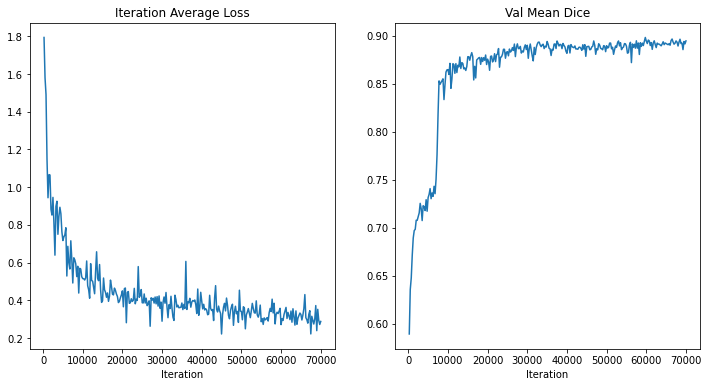

In [11]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [eval_num * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

### Check best model output with the input image and label

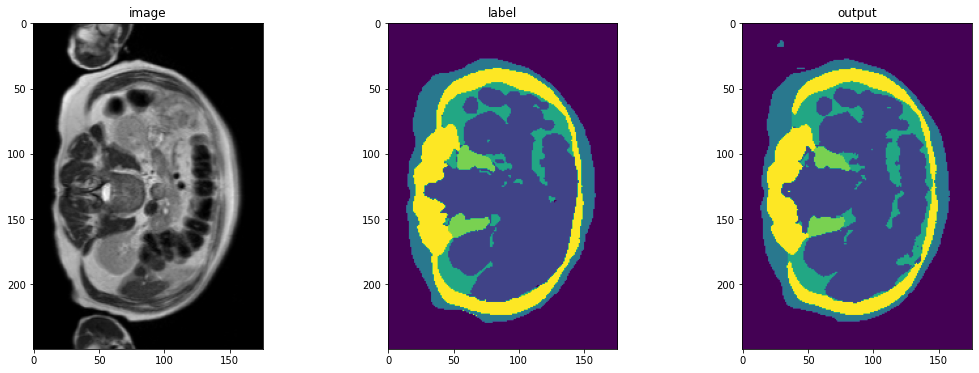

In [12]:
case_num = 0
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold4.pth")))
model.eval()
with torch.no_grad():
    img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).to(device)
    val_labels = torch.unsqueeze(label, 1).to(device)
    val_outputs = sliding_window_inference(
        val_inputs, (96, 96, 16), 4, model, overlap=0.8
    )
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title("image")
    plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, 5], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title("label")
    plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, 5])
    plt.subplot(1, 3, 3)
    plt.title("output")
    plt.imshow(
        torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 5]
    )
    plt.show()
    

### Inference on test images

In [6]:
import glob
from monai.data import Dataset
from monai.handlers.utils import from_engine
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    EnsureTyped,
    EnsureType,
    Invertd,
)

test_images = sorted(
    glob.glob(os.path.join(root_dir, "../data/imagesTs/", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(
            1.5, 1.5, 4.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250,
            b_min=0.0, b_max=1.0, clip=False,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        EnsureTyped(keys="image"),
    ]
)

test_org_ds = Dataset(
    data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose([
    EnsureTyped(keys="pred"),
    Invertd(
        keys="pred",
        transform=test_org_transforms,
        orig_keys="image",
        meta_keys="pred_meta_dict",
        orig_meta_keys="image_meta_dict",
        meta_key_postfix="meta_dict",
        nearest_interp=False,
        to_tensor=True,
    ),
    AsDiscreted(keys="pred", argmax=True, to_onehot=6),
    SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./outMR09fold4", output_postfix="seg", resample=False, separate_folder=False),
])

Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


2024-03-28 09:24:03,839 INFO image_writer.py:194 - writing: outMR09fold4/A002_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


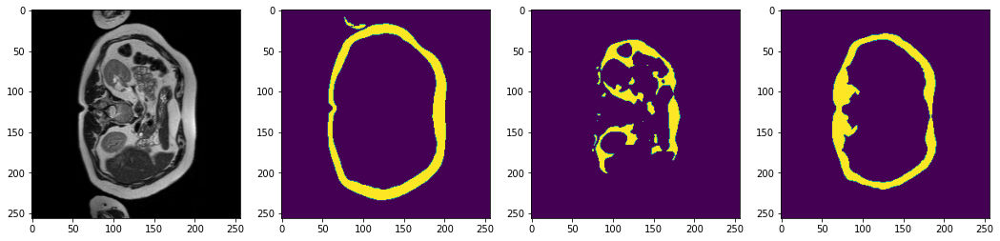

2024-03-28 09:24:06,232 INFO image_writer.py:194 - writing: outMR09fold4/A002_v2_T2W_seg.nii.gz


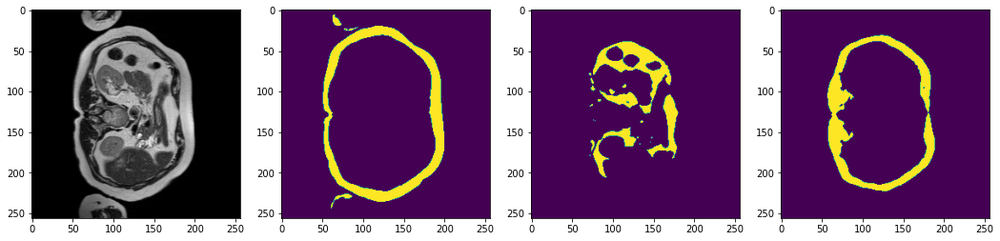

2024-03-28 09:24:08,741 INFO image_writer.py:194 - writing: outMR09fold4/A002_v3_T2W_seg.nii.gz


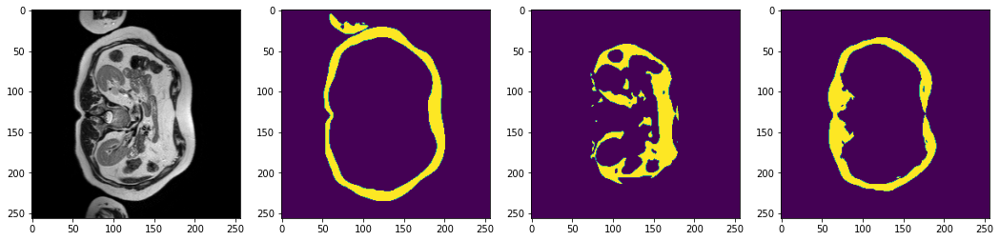

2024-03-28 09:24:11,043 INFO image_writer.py:194 - writing: outMR09fold4/A003_v1_T2W_seg.nii.gz


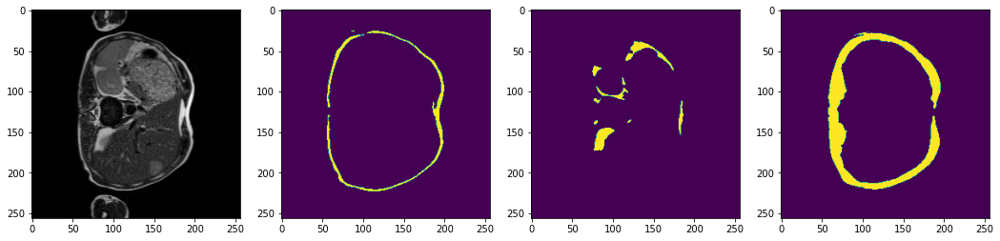

2024-03-28 09:24:13,384 INFO image_writer.py:194 - writing: outMR09fold4/A003_v2_T2W_seg.nii.gz


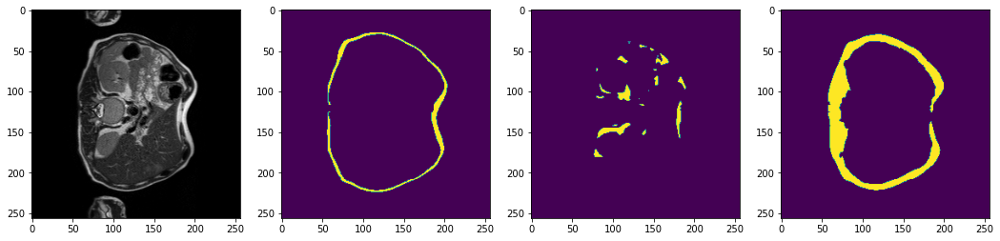

2024-03-28 09:24:15,723 INFO image_writer.py:194 - writing: outMR09fold4/A009_v1_T2W_seg.nii.gz


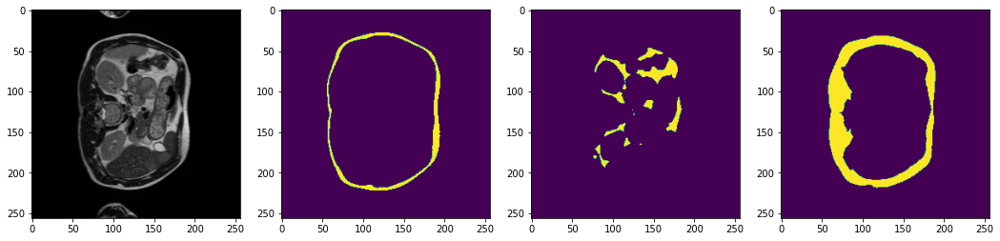

2024-03-28 09:24:18,074 INFO image_writer.py:194 - writing: outMR09fold4/A009_v2_T2W_seg.nii.gz


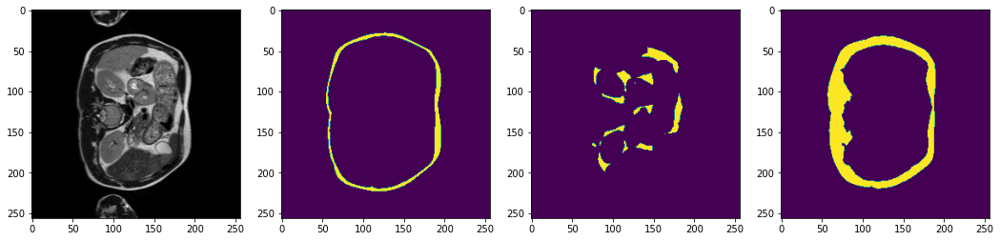

2024-03-28 09:24:20,426 INFO image_writer.py:194 - writing: outMR09fold4/A011_v1_T2W_seg.nii.gz


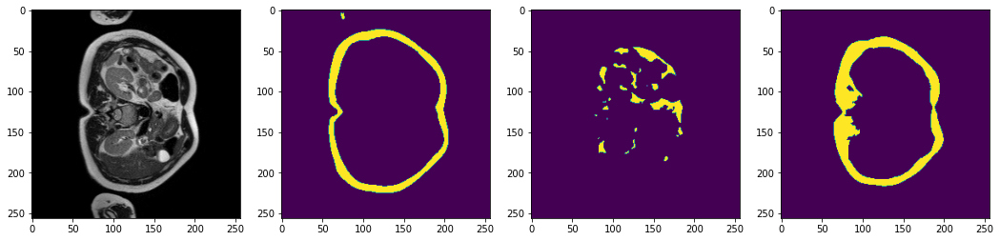

2024-03-28 09:24:22,760 INFO image_writer.py:194 - writing: outMR09fold4/A011_v2_T2W_seg.nii.gz


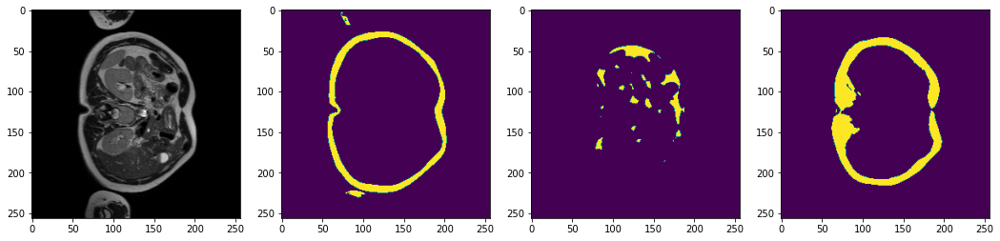

2024-03-28 09:24:25,253 INFO image_writer.py:194 - writing: outMR09fold4/A013_v1_T2W_seg.nii.gz


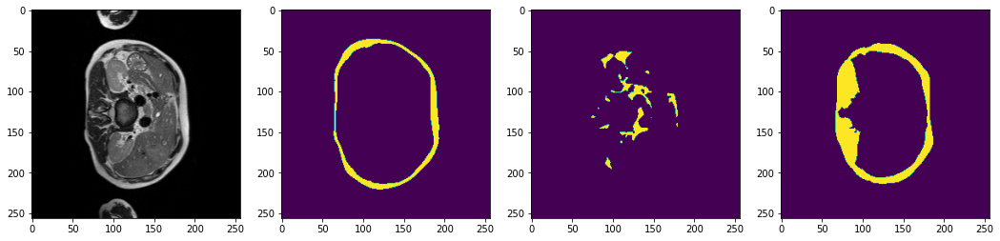

2024-03-28 09:24:27,368 INFO image_writer.py:194 - writing: outMR09fold4/A013_v2_T2W_seg.nii.gz


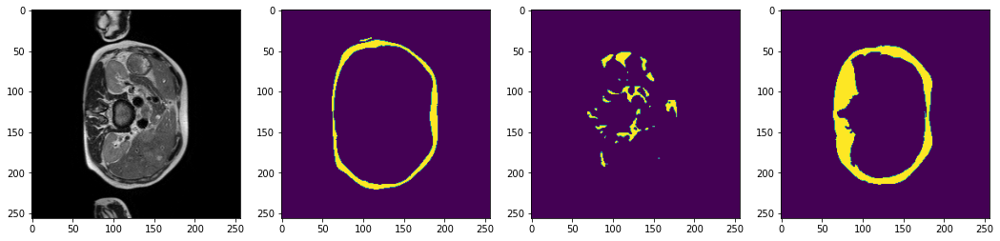

2024-03-28 09:24:29,712 INFO image_writer.py:194 - writing: outMR09fold4/A014_v1_T2W_seg.nii.gz


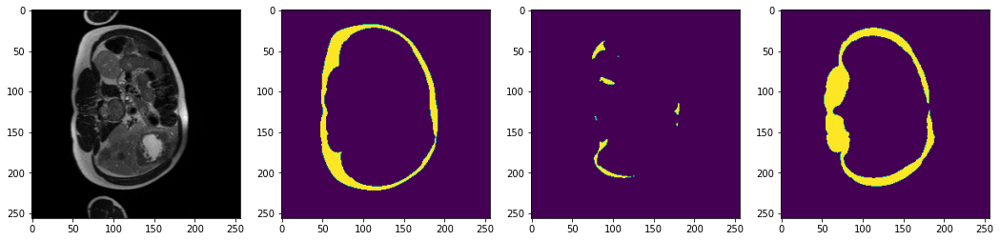

2024-03-28 09:24:32,029 INFO image_writer.py:194 - writing: outMR09fold4/A014_v2_T2W_seg.nii.gz


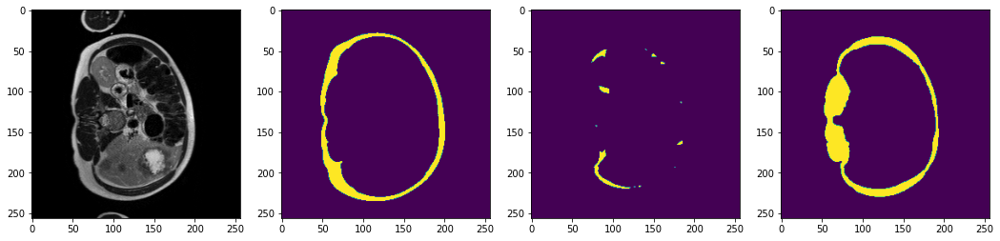

2024-03-28 09:24:34,361 INFO image_writer.py:194 - writing: outMR09fold4/A015_v1_T2W_seg.nii.gz


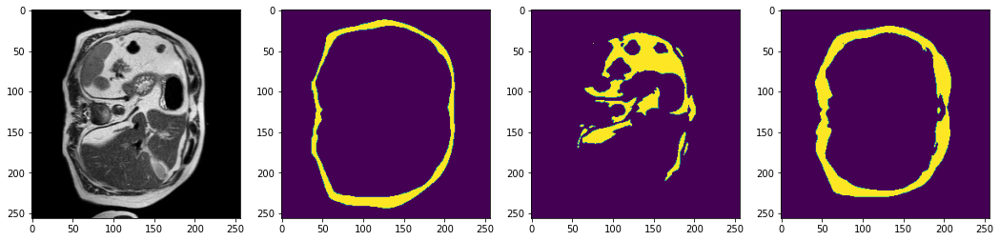

2024-03-28 09:24:36,684 INFO image_writer.py:194 - writing: outMR09fold4/A015_v2_T2W_seg.nii.gz


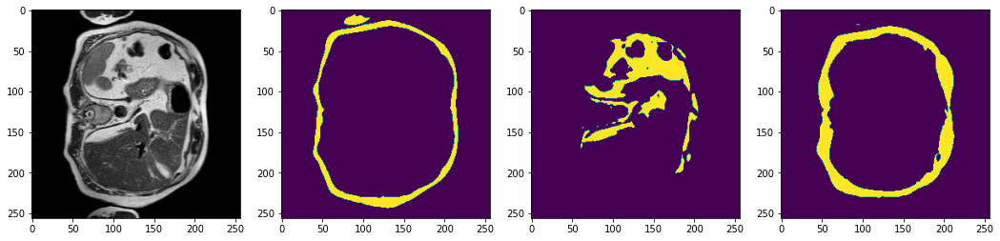

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:24:39,092 INFO image_writer.py:194 - writing: outMR09fold4/A016_v1_T2W_seg.nii.gz


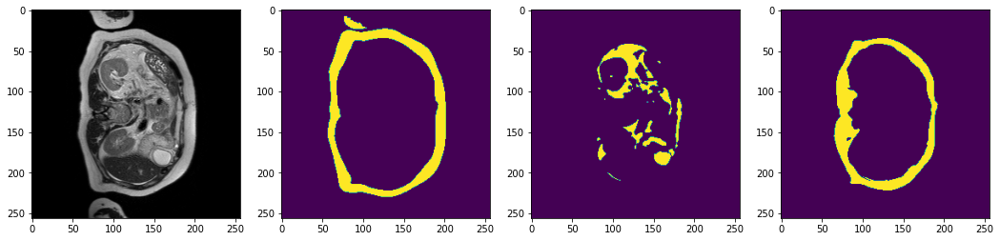

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:24:41,582 INFO image_writer.py:194 - writing: outMR09fold4/A016_v2_T2W_seg.nii.gz


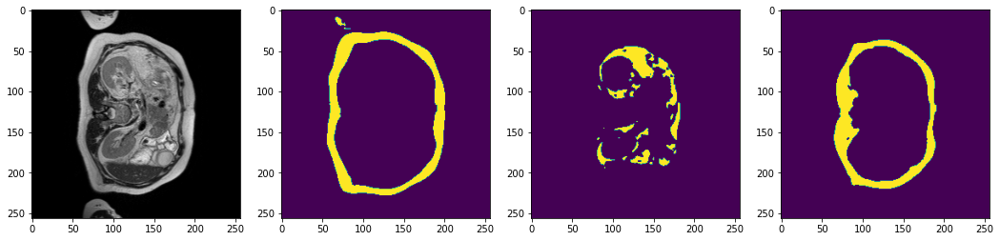

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:24:43,961 INFO image_writer.py:194 - writing: outMR09fold4/A017_v1_T2W_seg.nii.gz


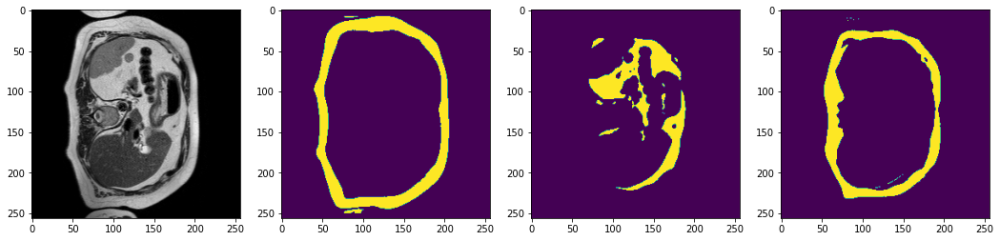

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:24:46,352 INFO image_writer.py:194 - writing: outMR09fold4/A017_v2_T2W_seg.nii.gz


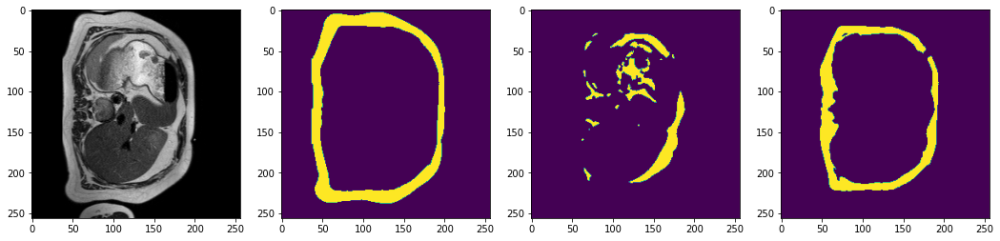

2024-03-28 09:24:48,694 INFO image_writer.py:194 - writing: outMR09fold4/A018_v1_T2W_seg.nii.gz


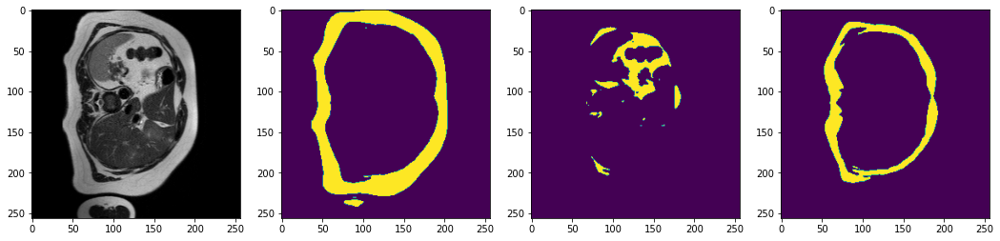

2024-03-28 09:24:51,065 INFO image_writer.py:194 - writing: outMR09fold4/A018_v2_T2W_seg.nii.gz


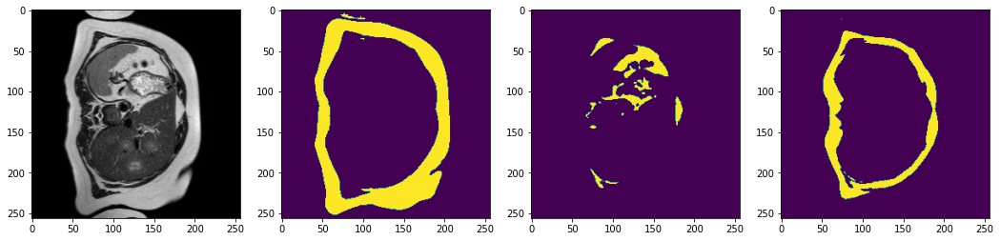

2024-03-28 09:24:53,403 INFO image_writer.py:194 - writing: outMR09fold4/A021_v1_T2W_seg.nii.gz


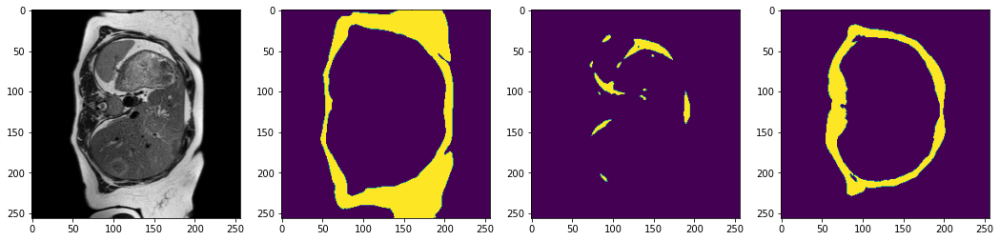

2024-03-28 09:24:55,768 INFO image_writer.py:194 - writing: outMR09fold4/A021_v2_T2W_seg.nii.gz


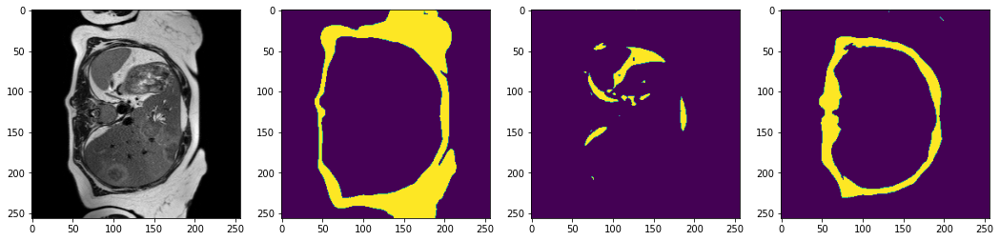

2024-03-28 09:25:01,608 INFO image_writer.py:194 - writing: outMR09fold4/A022_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


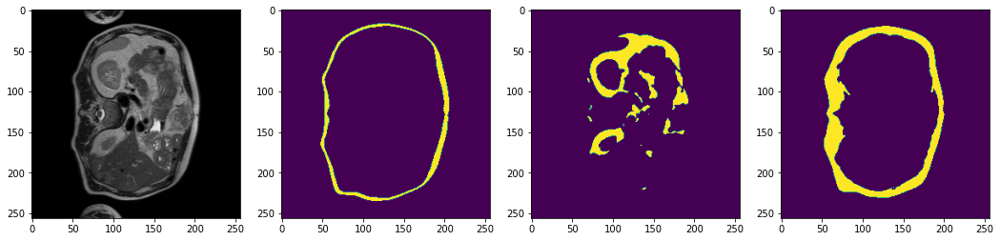

2024-03-28 09:25:07,262 INFO image_writer.py:194 - writing: outMR09fold4/A022_v2_T2W_seg.nii.gz


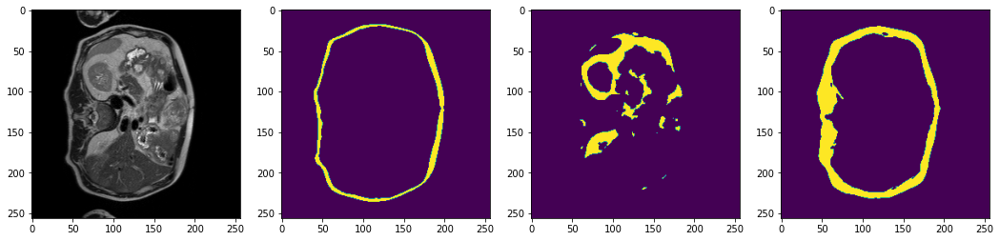

2024-03-28 09:25:12,973 INFO image_writer.py:194 - writing: outMR09fold4/A023_v1_T2W_seg.nii.gz


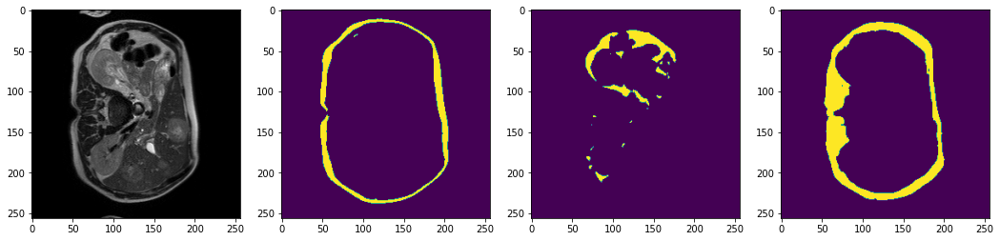

2024-03-28 09:25:18,679 INFO image_writer.py:194 - writing: outMR09fold4/A023_v2_T2W_seg.nii.gz


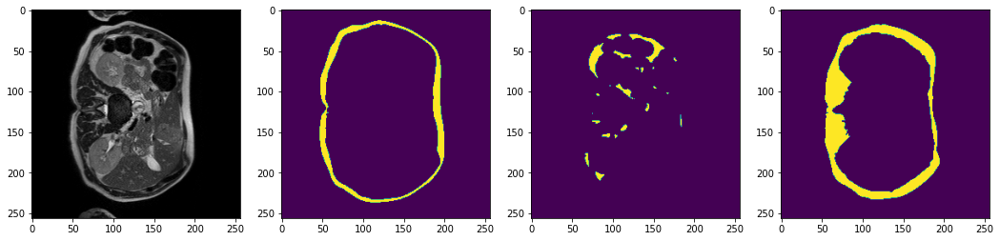

2024-03-28 09:25:21,082 INFO image_writer.py:194 - writing: outMR09fold4/A024_v1_T2W_seg.nii.gz


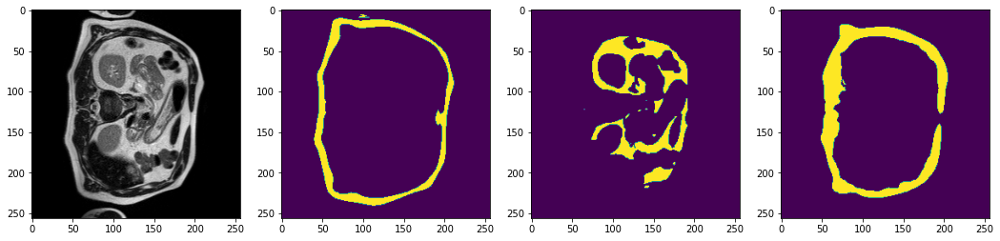

2024-03-28 09:25:23,450 INFO image_writer.py:194 - writing: outMR09fold4/A024_v2_T2W_seg.nii.gz


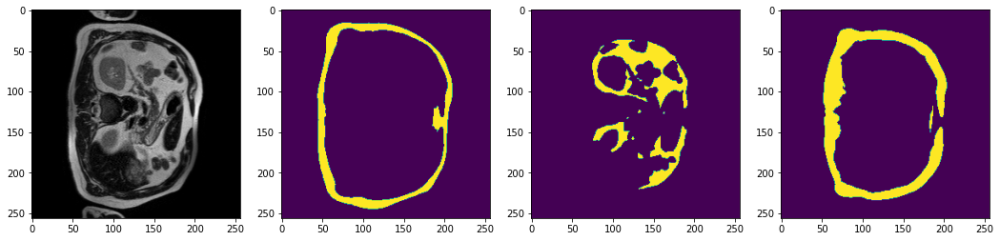

2024-03-28 09:25:29,172 INFO image_writer.py:194 - writing: outMR09fold4/A026_v1_T2W_seg.nii.gz


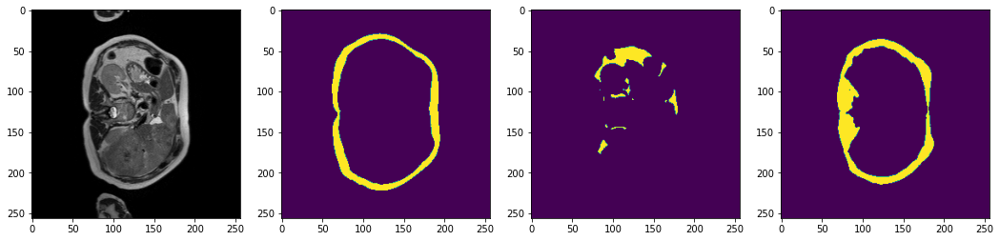

2024-03-28 09:25:35,113 INFO image_writer.py:194 - writing: outMR09fold4/A026_v2_T2W_seg.nii.gz


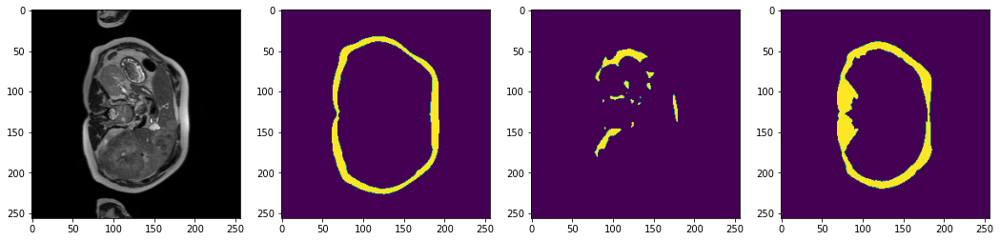

2024-03-28 09:25:37,488 INFO image_writer.py:194 - writing: outMR09fold4/A028_v1_T2W_seg.nii.gz


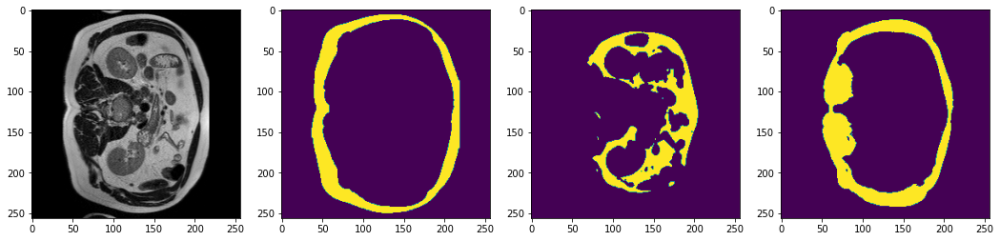

2024-03-28 09:25:39,869 INFO image_writer.py:194 - writing: outMR09fold4/A028_v2_T2W_seg.nii.gz


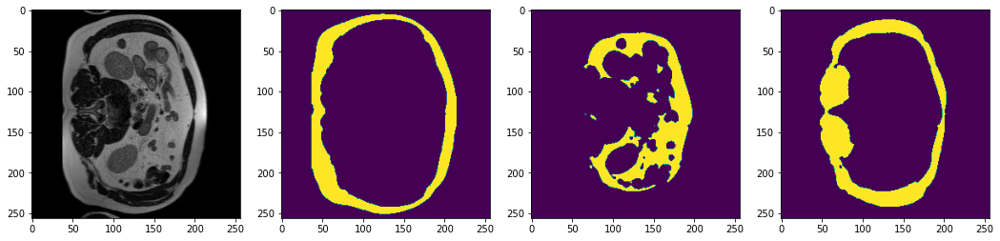

2024-03-28 09:25:42,252 INFO image_writer.py:194 - writing: outMR09fold4/A029_v1_T2W_seg.nii.gz


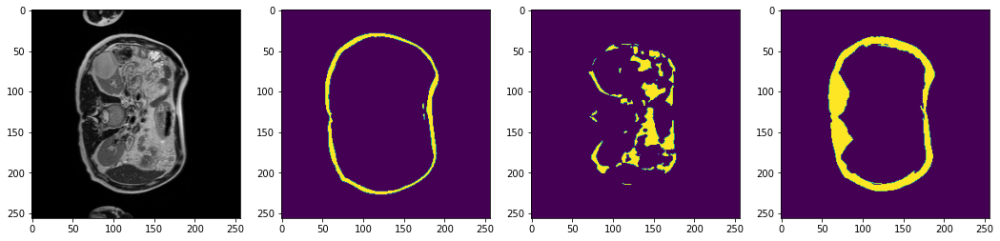

2024-03-28 09:25:44,406 INFO image_writer.py:194 - writing: outMR09fold4/A029_v2_T2W_seg.nii.gz


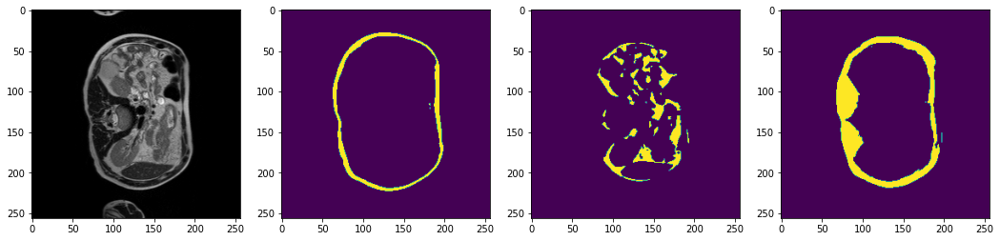

2024-03-28 09:25:46,793 INFO image_writer.py:194 - writing: outMR09fold4/A029_v3_T2W_seg.nii.gz


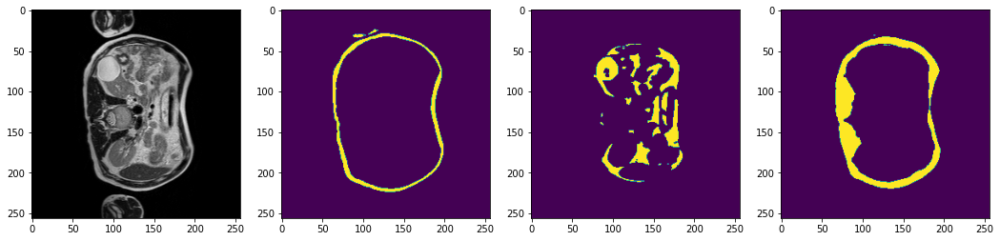

2024-03-28 09:25:48,895 INFO image_writer.py:194 - writing: outMR09fold4/A029_v4_T2W_seg.nii.gz


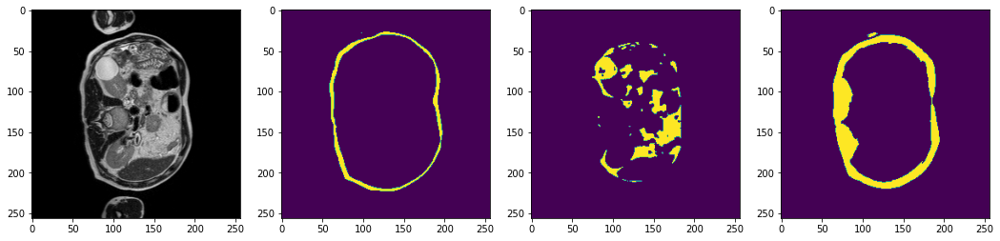

2024-03-28 09:25:51,281 INFO image_writer.py:194 - writing: outMR09fold4/A030_v1_T2W_seg.nii.gz


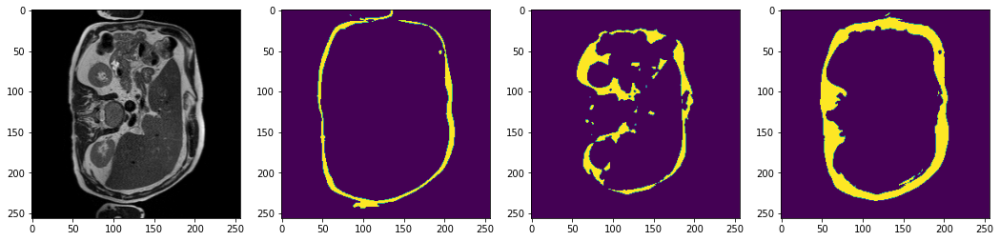

2024-03-28 09:25:53,804 INFO image_writer.py:194 - writing: outMR09fold4/A030_v2_T2W_seg.nii.gz


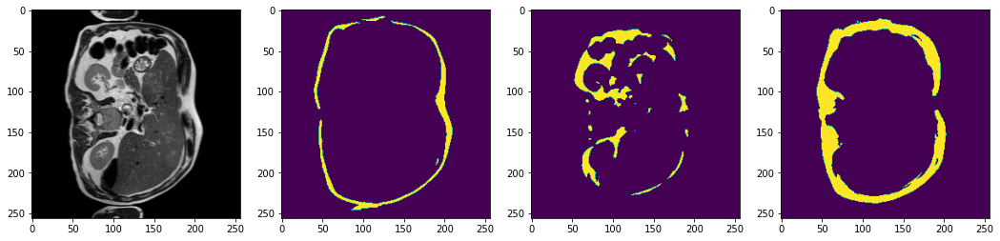

2024-03-28 09:25:55,879 INFO image_writer.py:194 - writing: outMR09fold4/A031_v1_T2W_seg.nii.gz


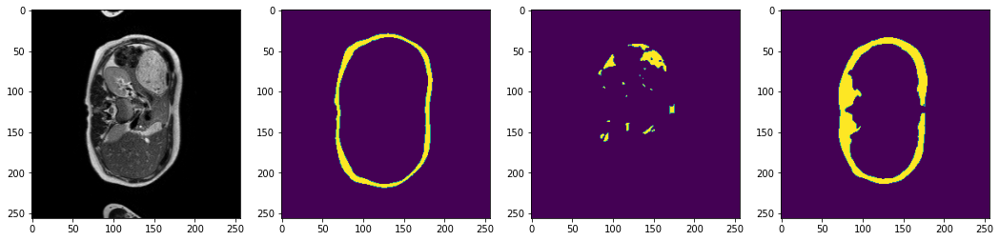

2024-03-28 09:25:57,981 INFO image_writer.py:194 - writing: outMR09fold4/A031_v2_T2W_seg.nii.gz


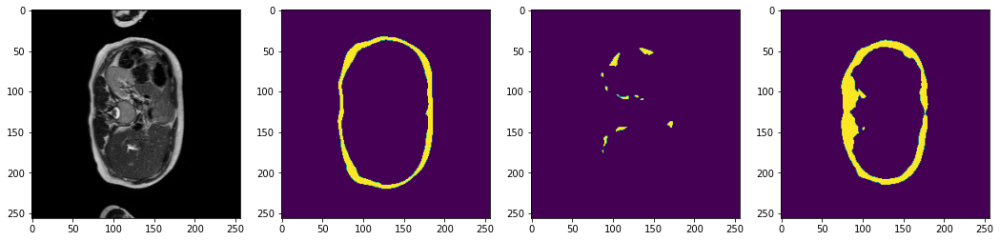

2024-03-28 09:26:03,689 INFO image_writer.py:194 - writing: outMR09fold4/A032_v1_T2W_seg.nii.gz


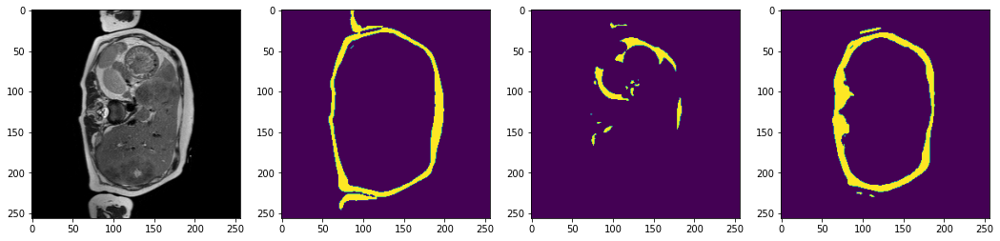

2024-03-28 09:26:09,406 INFO image_writer.py:194 - writing: outMR09fold4/A032_v2_T2W_seg.nii.gz


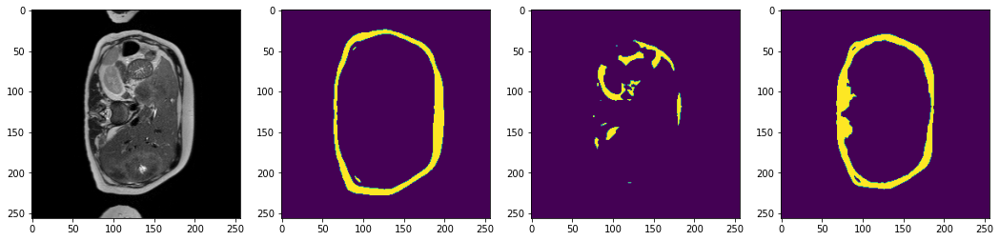

2024-03-28 09:26:15,073 INFO image_writer.py:194 - writing: outMR09fold4/A033_v1_T2W_seg.nii.gz


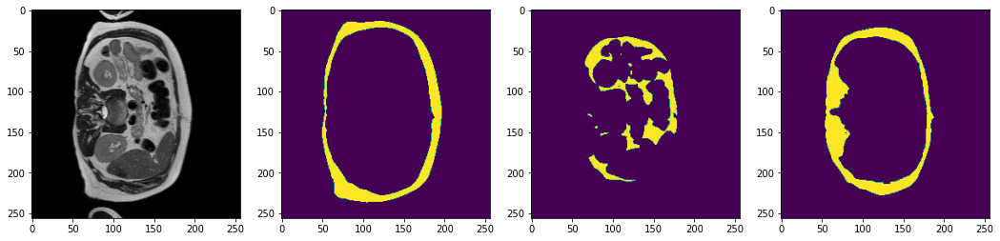

2024-03-28 09:26:20,755 INFO image_writer.py:194 - writing: outMR09fold4/A033_v2_T2W_seg.nii.gz


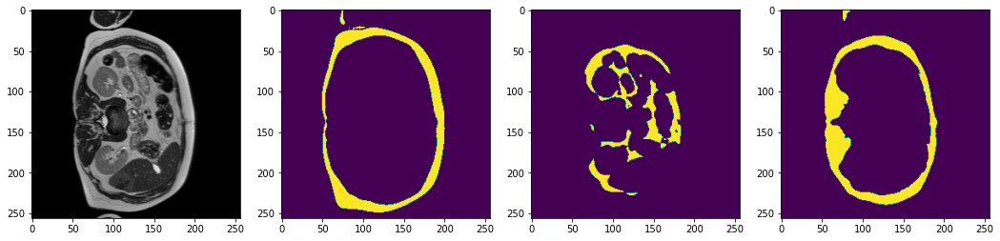

2024-03-28 09:26:26,618 INFO image_writer.py:194 - writing: outMR09fold4/A033_v3_T2W_seg.nii.gz


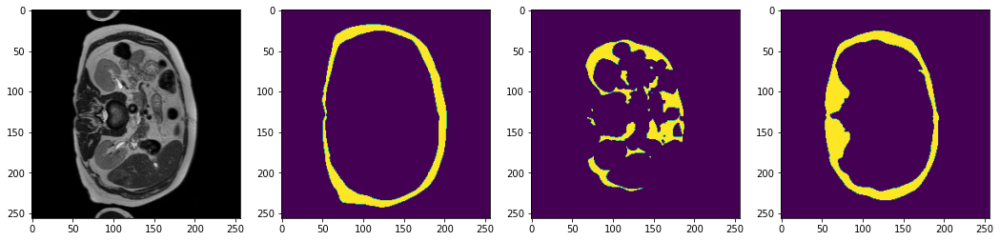

2024-03-28 09:26:32,285 INFO image_writer.py:194 - writing: outMR09fold4/A033_v4_T2W_seg.nii.gz


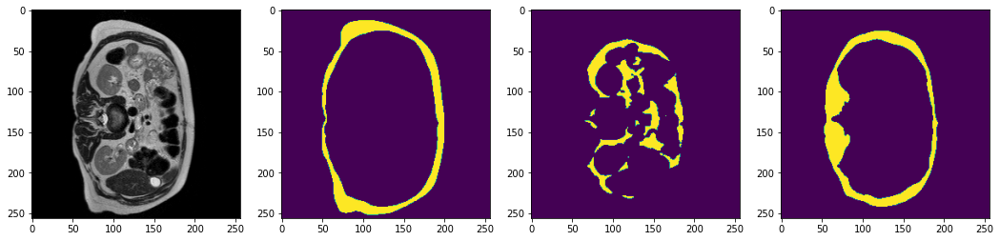

2024-03-28 09:26:37,961 INFO image_writer.py:194 - writing: outMR09fold4/A034_v1_T2W_seg.nii.gz


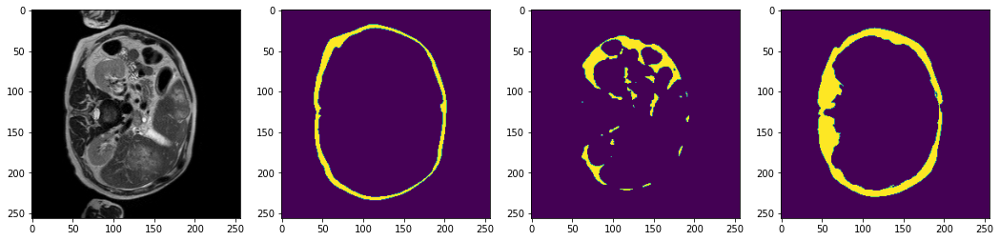

2024-03-28 09:26:43,676 INFO image_writer.py:194 - writing: outMR09fold4/A034_v2_T2W_seg.nii.gz


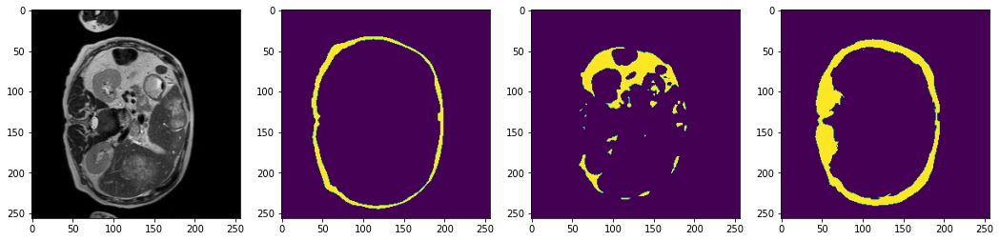

2024-03-28 09:26:49,375 INFO image_writer.py:194 - writing: outMR09fold4/A036_v1_T2W_seg.nii.gz


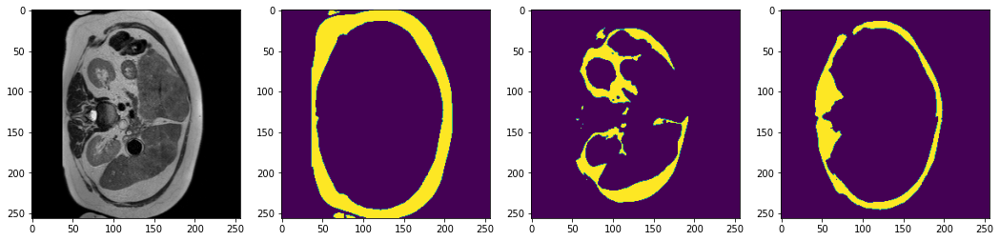

2024-03-28 09:26:55,051 INFO image_writer.py:194 - writing: outMR09fold4/A036_v2_T2W_seg.nii.gz


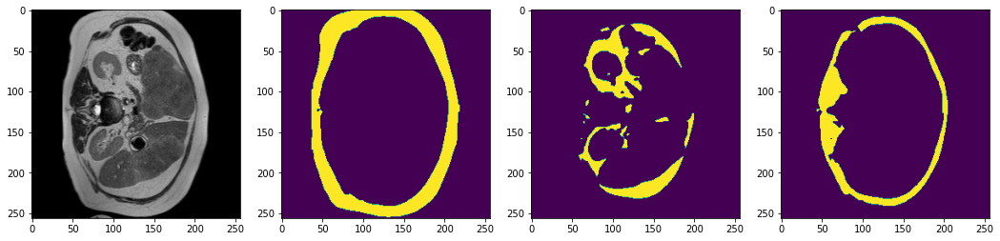

2024-03-28 09:26:59,932 INFO image_writer.py:194 - writing: outMR09fold4/A037_v1_T2W_seg.nii.gz


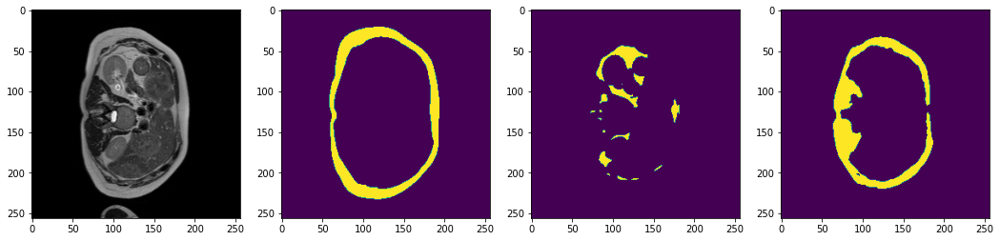

2024-03-28 09:27:05,747 INFO image_writer.py:194 - writing: outMR09fold4/A037_v2_T2W_seg.nii.gz


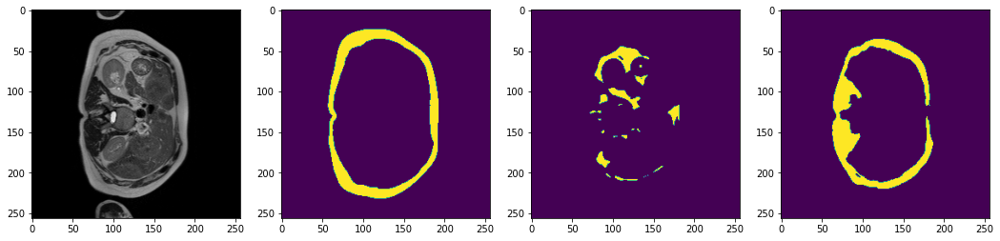

2024-03-28 09:27:08,113 INFO image_writer.py:194 - writing: outMR09fold4/A038_v1_T2W_seg.nii.gz


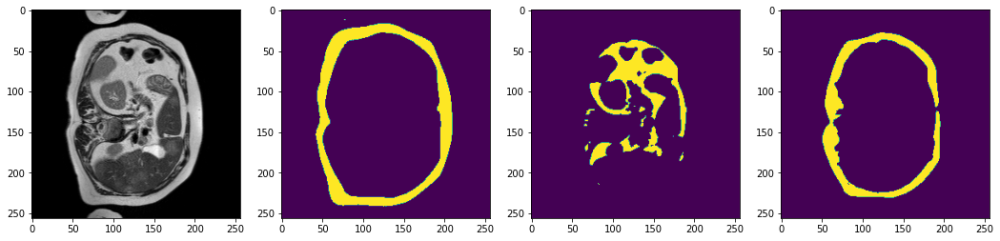

2024-03-28 09:27:10,475 INFO image_writer.py:194 - writing: outMR09fold4/A038_v2_T2W_seg.nii.gz


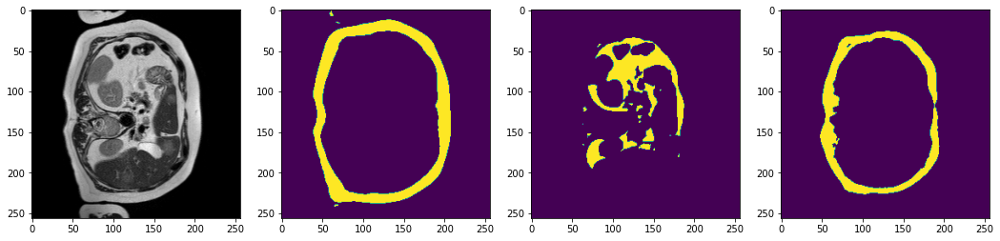

2024-03-28 09:27:12,550 INFO image_writer.py:194 - writing: outMR09fold4/A039_v1_T2W_seg.nii.gz


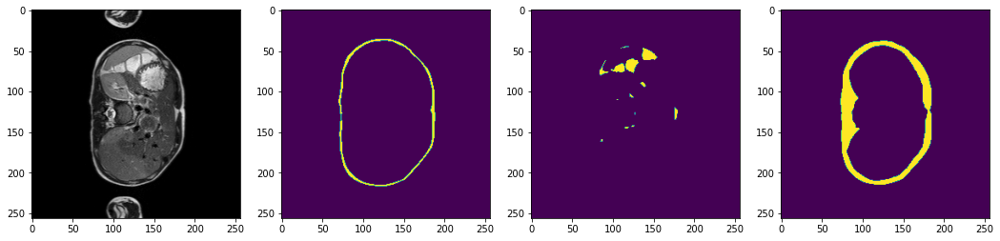

2024-03-28 09:27:14,365 INFO image_writer.py:194 - writing: outMR09fold4/A039_v2_T2W_seg.nii.gz


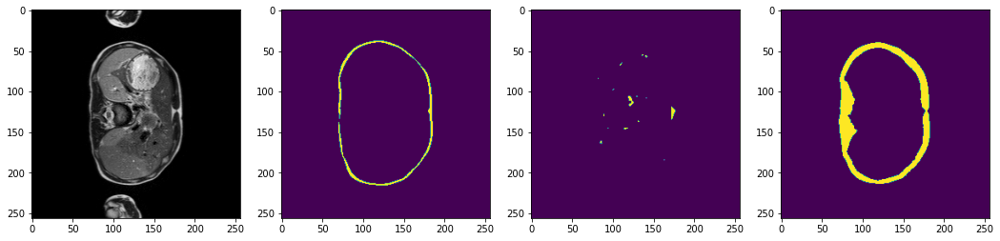

2024-03-28 09:27:20,069 INFO image_writer.py:194 - writing: outMR09fold4/A040_v1_T2W_seg.nii.gz


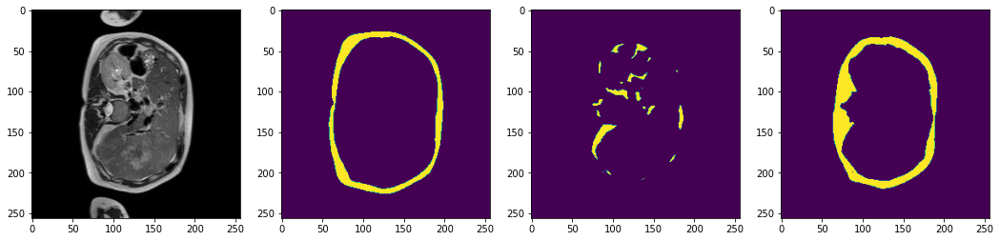

2024-03-28 09:27:25,809 INFO image_writer.py:194 - writing: outMR09fold4/A040_v2_T2W_seg.nii.gz


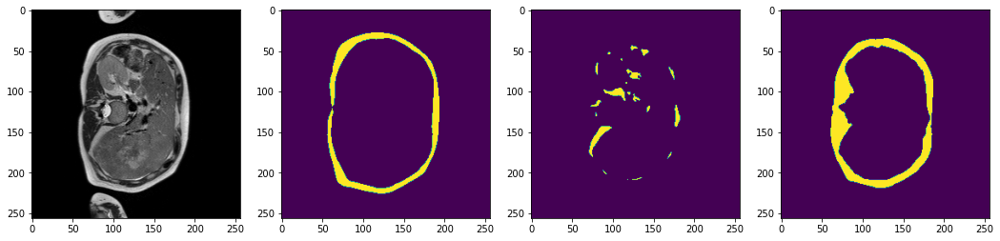

2024-03-28 09:27:28,192 INFO image_writer.py:194 - writing: outMR09fold4/A041_v1_T2W_seg.nii.gz


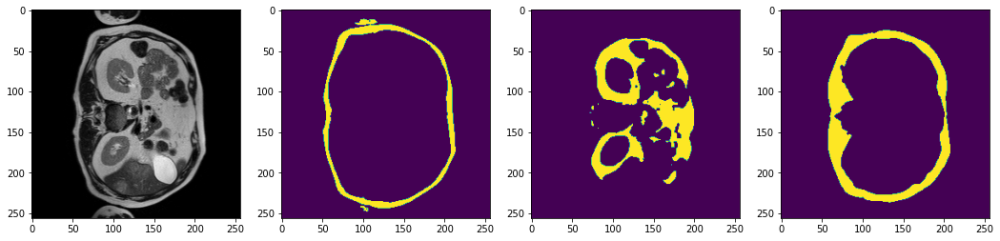

2024-03-28 09:27:30,740 INFO image_writer.py:194 - writing: outMR09fold4/A041_v2_T2W_seg.nii.gz


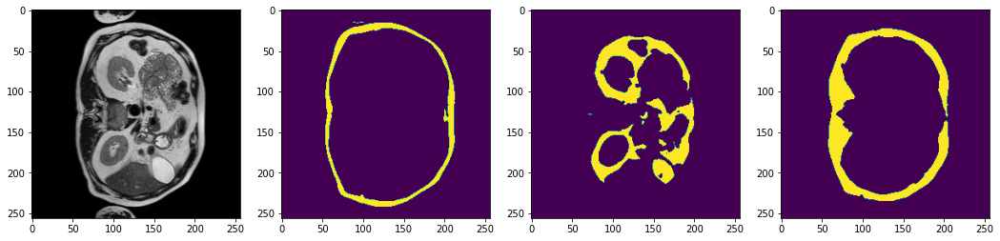

2024-03-28 09:27:36,458 INFO image_writer.py:194 - writing: outMR09fold4/A043_v1_T2W_seg.nii.gz


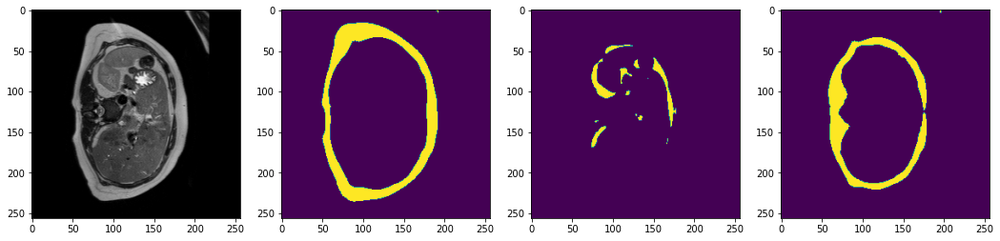

2024-03-28 09:27:42,102 INFO image_writer.py:194 - writing: outMR09fold4/A043_v2_T2W_seg.nii.gz


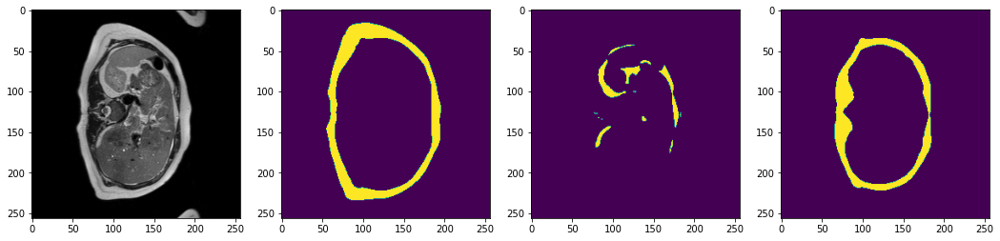

2024-03-28 09:27:47,806 INFO image_writer.py:194 - writing: outMR09fold4/A043_v5_T2W_seg.nii.gz


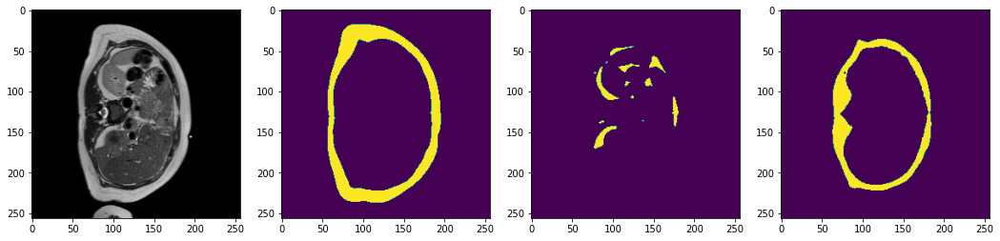

2024-03-28 09:27:50,159 INFO image_writer.py:194 - writing: outMR09fold4/A046_v1_T2W_seg.nii.gz


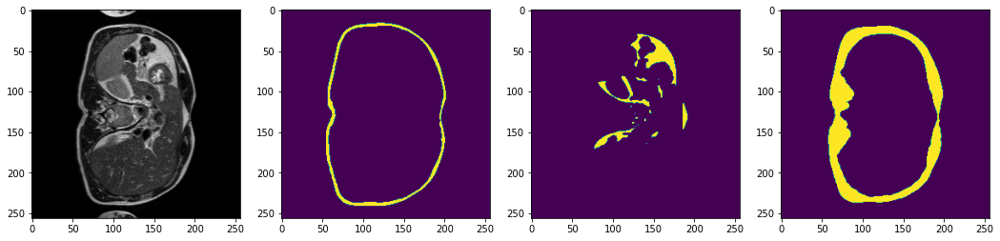

2024-03-28 09:27:52,528 INFO image_writer.py:194 - writing: outMR09fold4/A046_v2_T2W_seg.nii.gz


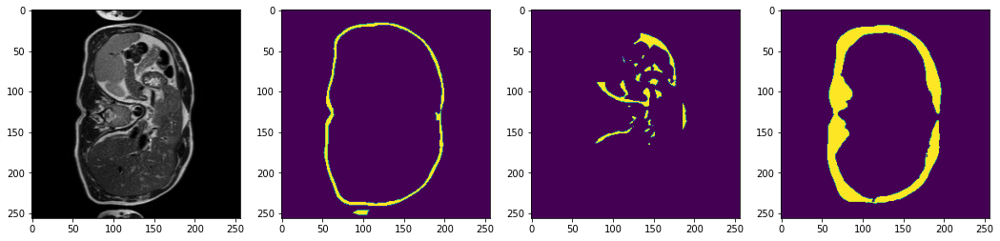

2024-03-28 09:27:54,897 INFO image_writer.py:194 - writing: outMR09fold4/A047_v1_T2W_seg.nii.gz


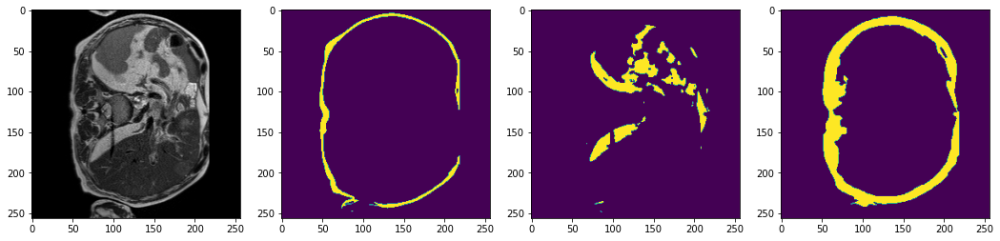

2024-03-28 09:27:57,425 INFO image_writer.py:194 - writing: outMR09fold4/A047_v2_T2W_seg.nii.gz


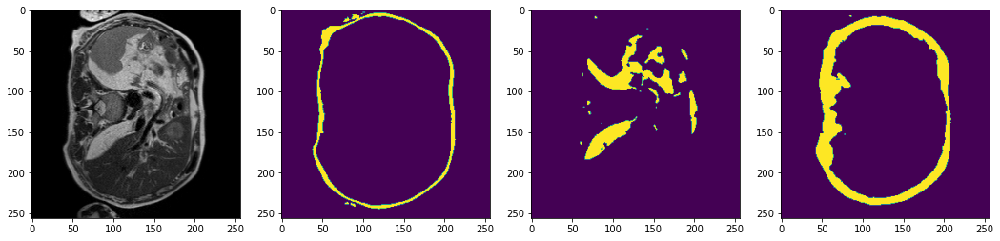

2024-03-28 09:27:59,811 INFO image_writer.py:194 - writing: outMR09fold4/A048_v1_T2W_seg.nii.gz


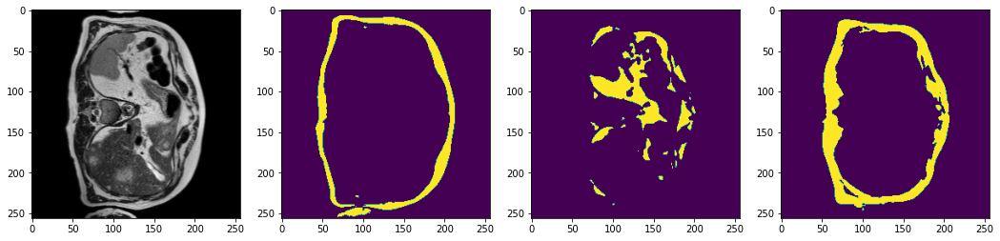

2024-03-28 09:28:02,170 INFO image_writer.py:194 - writing: outMR09fold4/A048_v2_T2W_seg.nii.gz


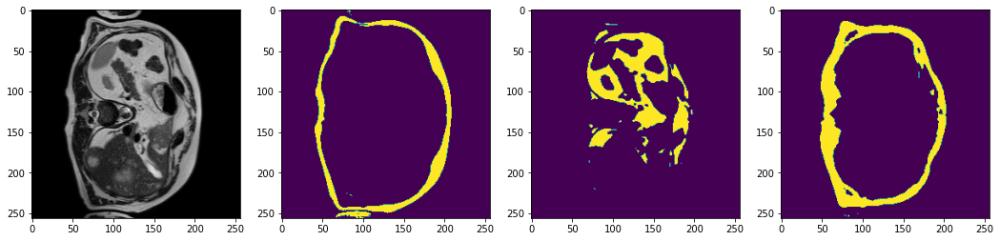

2024-03-28 09:28:04,543 INFO image_writer.py:194 - writing: outMR09fold4/A049_v1_T2W_seg.nii.gz


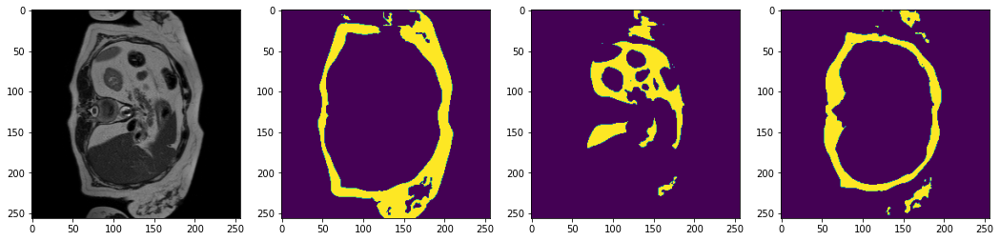

2024-03-28 09:28:06,897 INFO image_writer.py:194 - writing: outMR09fold4/A049_v2_T2W_seg.nii.gz


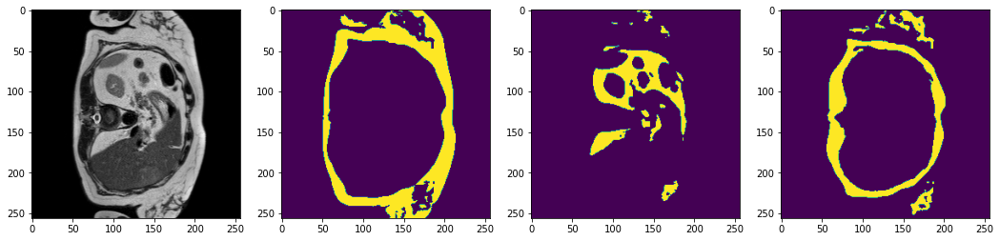

2024-03-28 09:28:09,287 INFO image_writer.py:194 - writing: outMR09fold4/A050_v1_T2W_seg.nii.gz


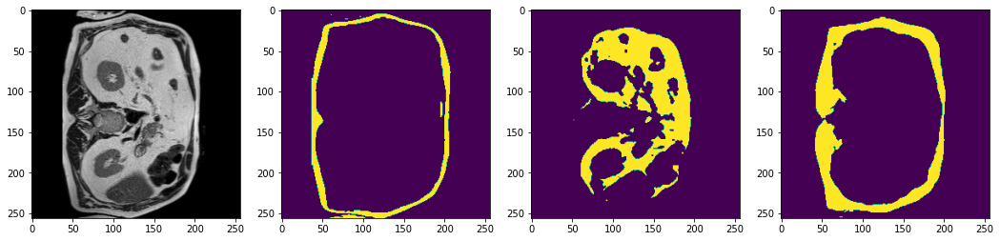

2024-03-28 09:28:11,698 INFO image_writer.py:194 - writing: outMR09fold4/A050_v2_T2W_seg.nii.gz


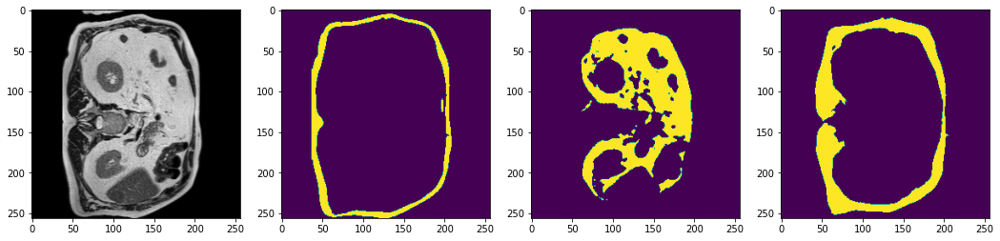

2024-03-28 09:28:14,251 INFO image_writer.py:194 - writing: outMR09fold4/A051_v1_T2W_seg.nii.gz


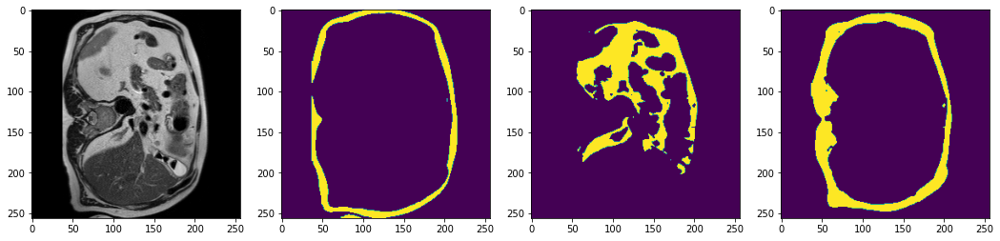

2024-03-28 09:28:16,706 INFO image_writer.py:194 - writing: outMR09fold4/A051_v2_T2W_seg.nii.gz


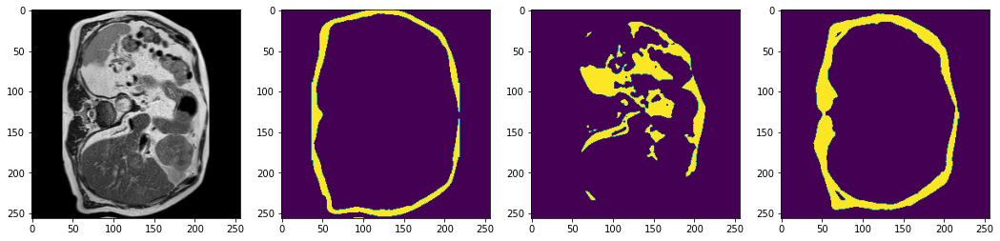

2024-03-28 09:28:22,459 INFO image_writer.py:194 - writing: outMR09fold4/A052_v1_T2W_seg.nii.gz


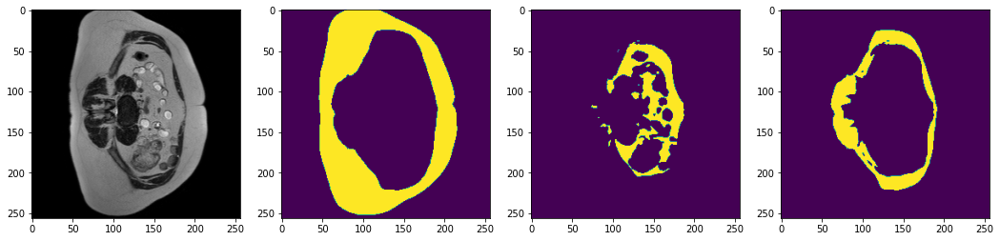

2024-03-28 09:28:28,134 INFO image_writer.py:194 - writing: outMR09fold4/A052_v2_T2W_seg.nii.gz


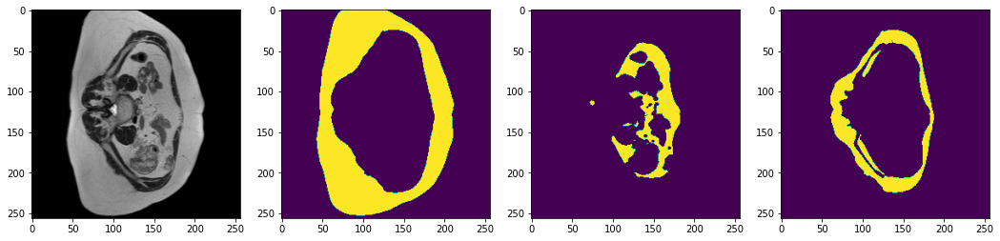

2024-03-28 09:28:30,514 INFO image_writer.py:194 - writing: outMR09fold4/A055_v1_T2W_seg.nii.gz


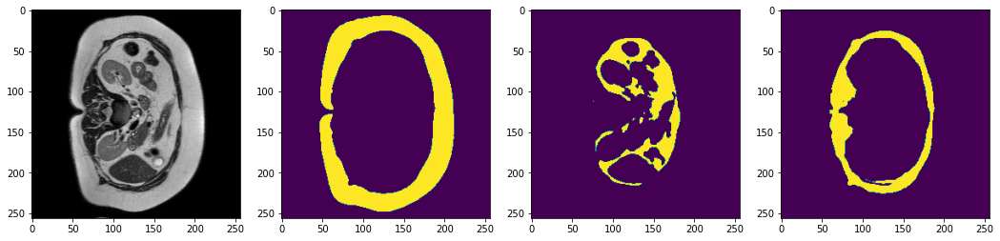

2024-03-28 09:28:32,901 INFO image_writer.py:194 - writing: outMR09fold4/A055_v2_T2W_seg.nii.gz


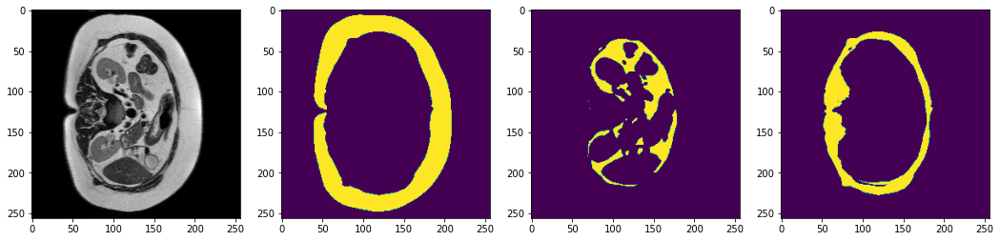

2024-03-28 09:28:35,296 INFO image_writer.py:194 - writing: outMR09fold4/A056_v1_T2W_seg.nii.gz


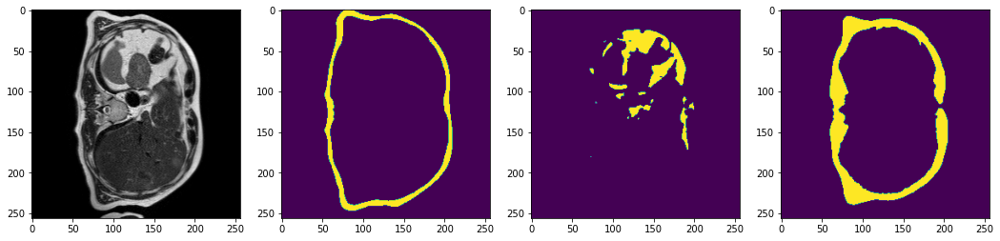

2024-03-28 09:28:37,792 INFO image_writer.py:194 - writing: outMR09fold4/A056_v2_T2W_seg.nii.gz


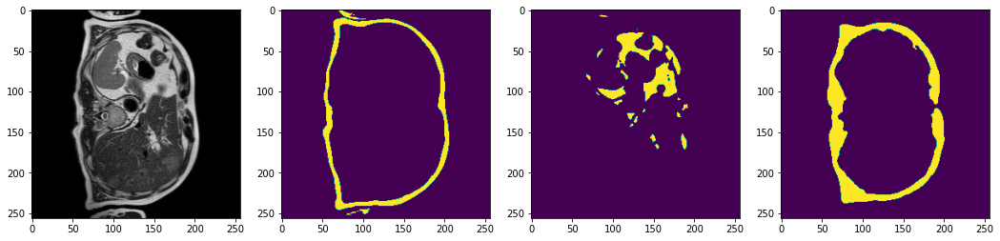

2024-03-28 09:28:40,178 INFO image_writer.py:194 - writing: outMR09fold4/A057_v1_T2W_seg.nii.gz


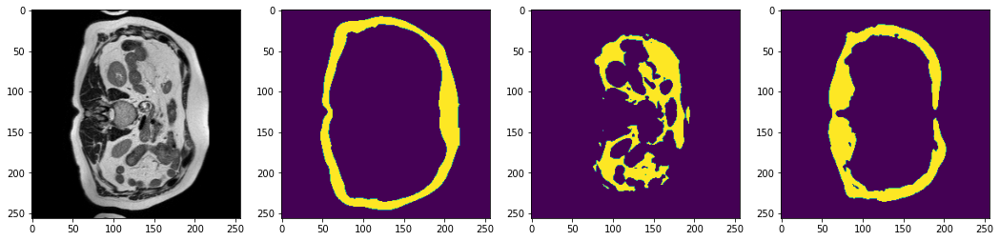

2024-03-28 09:28:42,558 INFO image_writer.py:194 - writing: outMR09fold4/A057_v2_T2W_seg.nii.gz


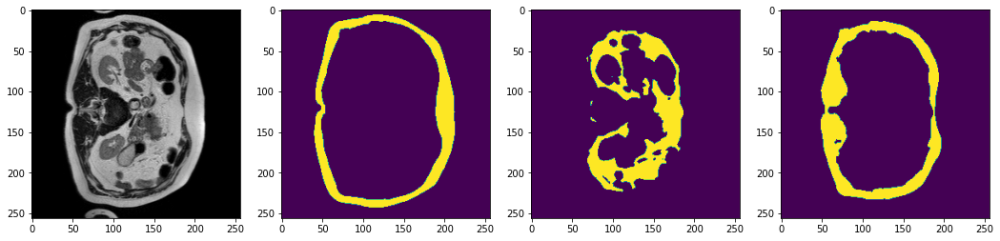

2024-03-28 09:28:48,264 INFO image_writer.py:194 - writing: outMR09fold4/A061_v1_T2W_seg.nii.gz


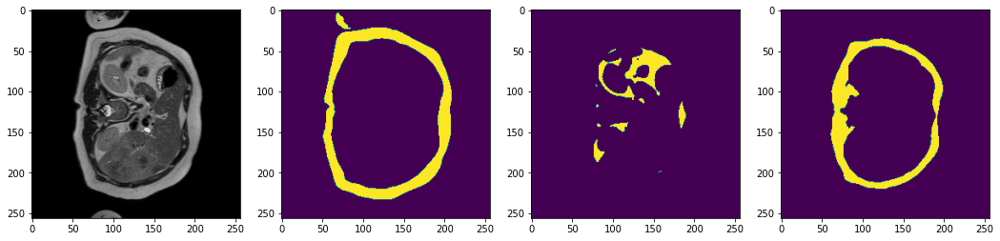

2024-03-28 09:28:53,992 INFO image_writer.py:194 - writing: outMR09fold4/A061_v2_T2W_seg.nii.gz


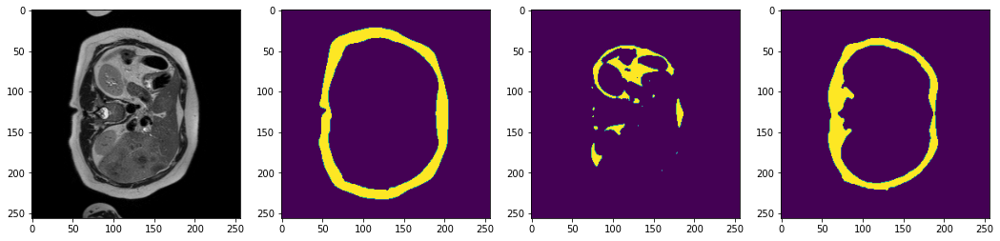

2024-03-28 09:28:56,108 INFO image_writer.py:194 - writing: outMR09fold4/A062_v1_T2W_seg.nii.gz


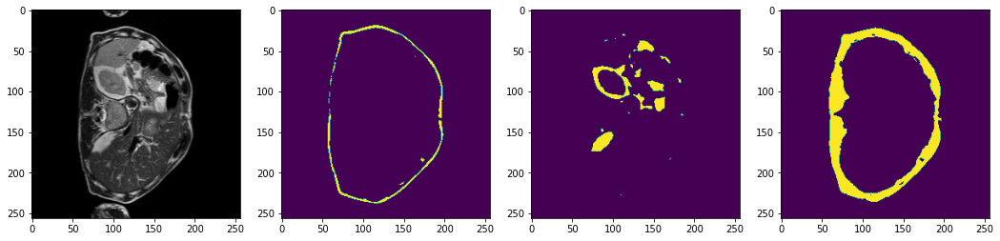

2024-03-28 09:28:58,233 INFO image_writer.py:194 - writing: outMR09fold4/A062_v2_T2W_seg.nii.gz


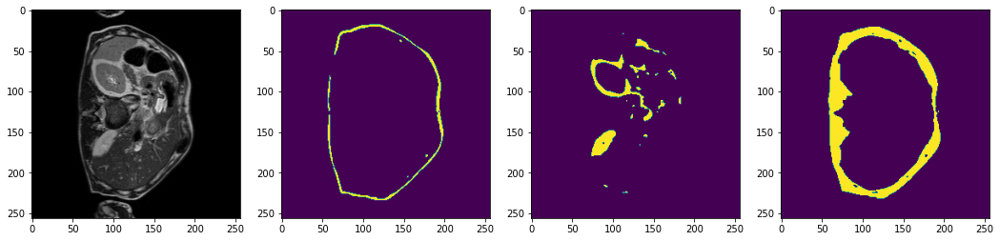

2024-03-28 09:29:00,786 INFO image_writer.py:194 - writing: outMR09fold4/A063_v1_T2W_seg.nii.gz


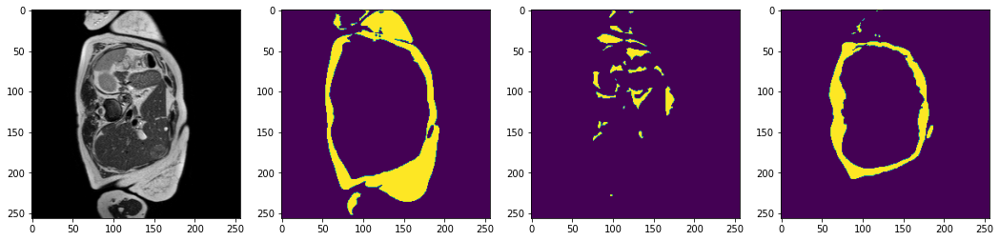

2024-03-28 09:29:03,161 INFO image_writer.py:194 - writing: outMR09fold4/A063_v2_T2W_seg.nii.gz


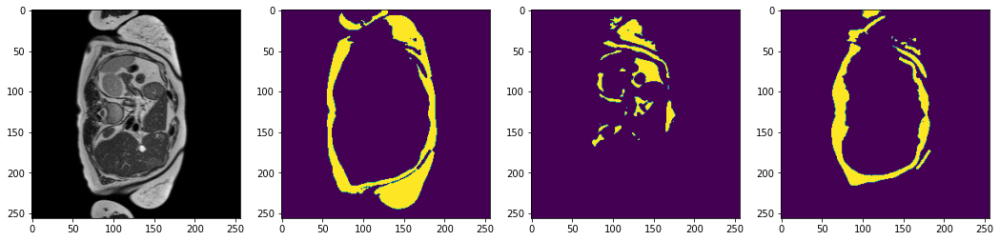

2024-03-28 09:29:05,537 INFO image_writer.py:194 - writing: outMR09fold4/A064_v1_T2W_seg.nii.gz


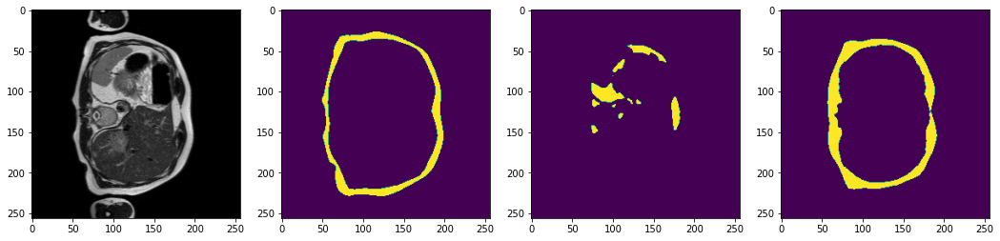

2024-03-28 09:29:07,887 INFO image_writer.py:194 - writing: outMR09fold4/A064_v2_T2W_seg.nii.gz


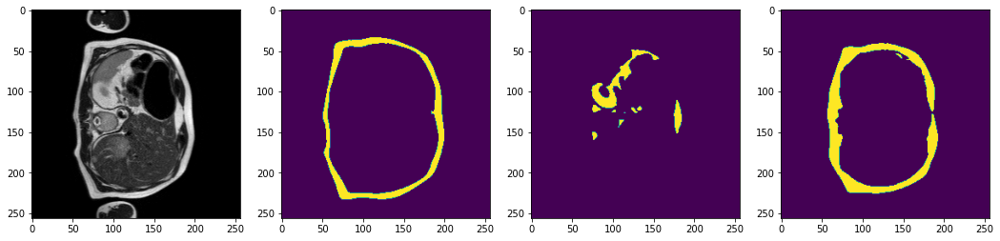

2024-03-28 09:29:10,266 INFO image_writer.py:194 - writing: outMR09fold4/A066_v1_T2W_seg.nii.gz


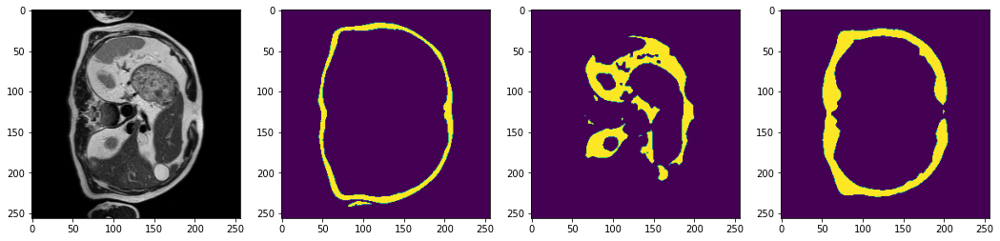

2024-03-28 09:29:12,619 INFO image_writer.py:194 - writing: outMR09fold4/A066_v2_T2W_seg.nii.gz


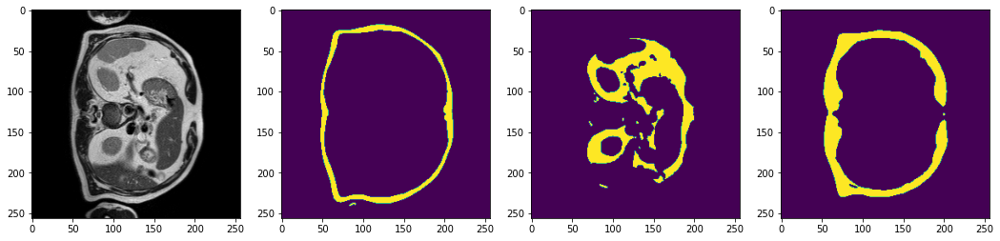

2024-03-28 09:29:15,003 INFO image_writer.py:194 - writing: outMR09fold4/A067_v1_T2W_seg.nii.gz


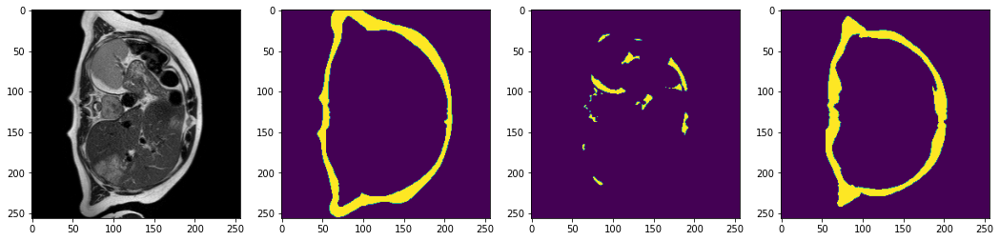

2024-03-28 09:29:17,531 INFO image_writer.py:194 - writing: outMR09fold4/A067_v2_T2W_seg.nii.gz


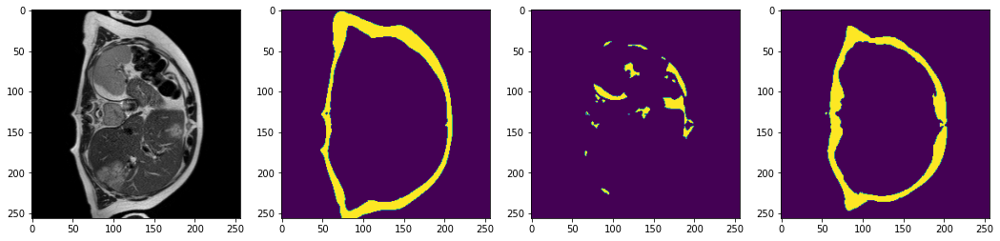

2024-03-28 09:29:19,493 INFO image_writer.py:194 - writing: outMR09fold4/A068_v1_T2W_seg.nii.gz


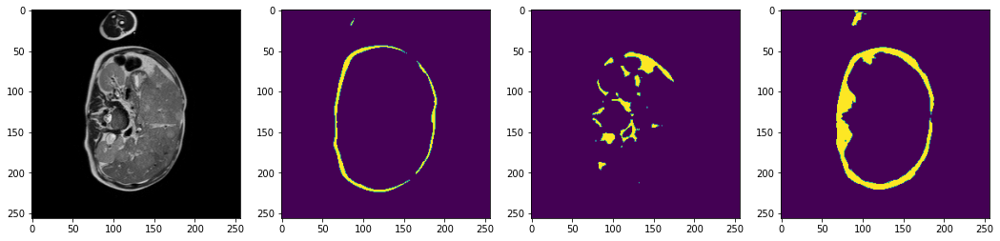

2024-03-28 09:29:21,577 INFO image_writer.py:194 - writing: outMR09fold4/A068_v2_T2W_seg.nii.gz


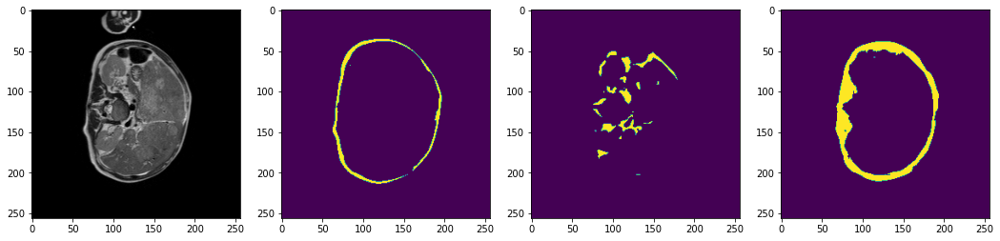

2024-03-28 09:29:26,443 INFO image_writer.py:194 - writing: outMR09fold4/A071_v1_T2W_seg.nii.gz


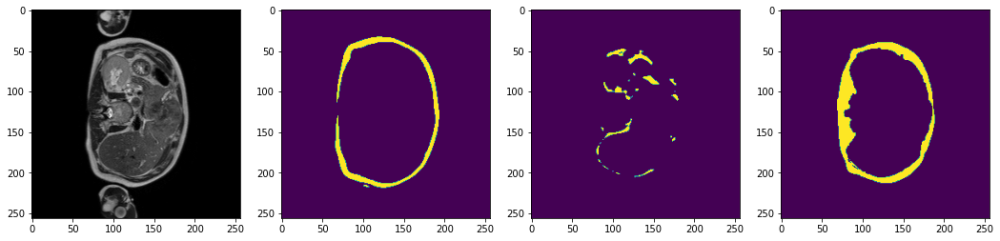

2024-03-28 09:29:31,290 INFO image_writer.py:194 - writing: outMR09fold4/A071_v2_T2W_seg.nii.gz


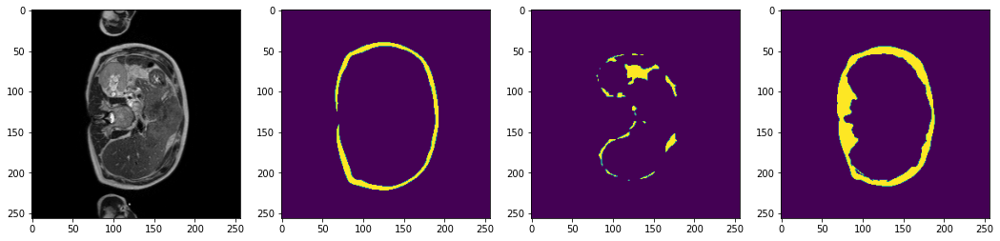

2024-03-28 09:29:36,148 INFO image_writer.py:194 - writing: outMR09fold4/A074_v1_T2W_seg.nii.gz


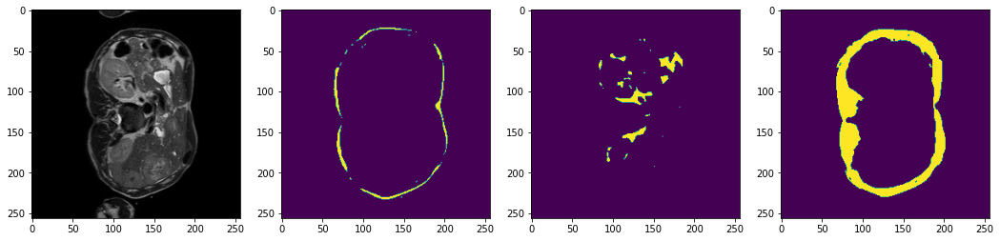

2024-03-28 09:29:41,818 INFO image_writer.py:194 - writing: outMR09fold4/A074_v2_T2W_seg.nii.gz


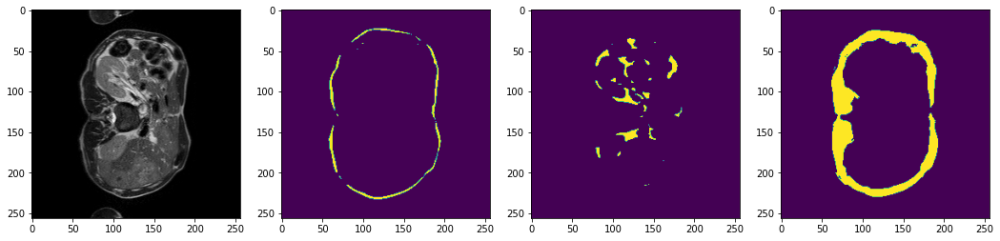

2024-03-28 09:29:44,063 INFO image_writer.py:194 - writing: outMR09fold4/A076_v1_T2W_seg.nii.gz


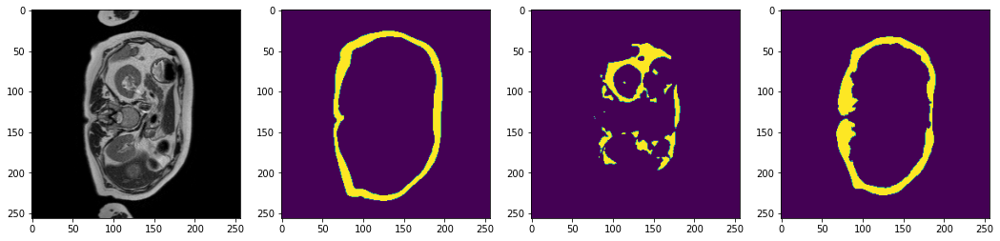

2024-03-28 09:29:46,472 INFO image_writer.py:194 - writing: outMR09fold4/A076_v2_T2W_seg.nii.gz


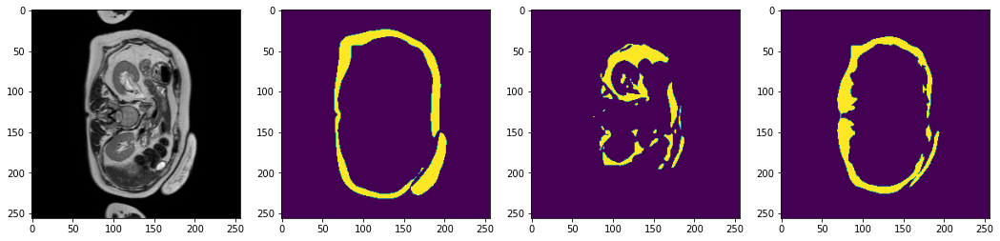

In [7]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(
    os.path.join(root_dir, "TestMR09_unetrensemble_fold4.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (96, 96, 16)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(
            test_inputs, roi_size, sw_batch_size, model, overlap=0.8)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

#         # uncomment the following lines to visualize the predicted results
        test_output = from_engine(["pred"])(test_data)

        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]

        plt.figure("check", (18, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(original_image[:, :, 8], cmap="gray")
        plt.subplot(1, 4, 2)
        plt.imshow(test_output[0].detach().cpu()[2, :, :, 8])
        plt.subplot(1, 4, 3)
        plt.imshow(test_output[0].detach().cpu()[3, :, :, 8])
        plt.subplot(1, 4, 4)
        plt.imshow(test_output[0].detach().cpu()[5, :, :, 8])
        plt.show()

In [ ]:
!tar -cvzf outMR09fold4.tar.gz outMR09fold4